In [1]:
import warnings
import pickle
warnings.simplefilter(action='ignore')

In [2]:
DATA_DIR = '/path_to_data'
fig_save_path =  '/path_to_figures/'


In [3]:
def enrich_factors(gsets, factor_dict, background='hsapiens_gene_ensembl'):
    ''' 
    calculate gene set enrichment scores for gene sets in factor marker genes.
    gsets: 'dictionary containing gene set names (keys) and gene sets (values)'
    factor_dict: 'dictionary containing factor names (keys) and factor marker genes (values)
    background: 'background genes to use for gsea enrichr (accepts string for reference genome in gseapy or int for background gene number)
    ''' 
    import gseapy as gp
    #gsets= {'CD8-T_tumor-reactive-like_UP':list(input_df[input_df['gs.name']=='CD8-T_tumor-reactive-like_UP']['g.name']),
           # 'CD8-T_terminal-exhaustion':list(input_df[input_df['gs.name']=='CD8-T_terminal-exhaustion']['g.name'])}
    gsets= all_gs

    enr_df_list = []
    enr_dict = {}

    for i,v in factor_dict.items():
        glist = list(v)
        print(glist)
        enr = gp.enrichr(gene_list=glist,
                     gene_sets=gsets,
                     background=background, # or the number of genes, e.g 20000
                     outdir=None,
                     verbose=True)
        enr.results['factor'] = len(enr.results)*[i]
        enr_df_list.append(enr.results)
        enr_dict[i] = enr
    enr_df = pd.concat(enr_df_list)

    return enr_df,enr_dict

In [4]:
def compare_factors(df, data_column, matching_variable, comparison_variable, comparison_levels,test='wilcoxon',
                         zero_method='wilcox', correction=False, 
                          alternative='two-sided',  axis=0, 
                          nan_policy='propagate'):
    '''
    compute wilcoxon matched pairs signed rank on pandas dataframe
    df: pandas.DataFrame e.g. containing aggregated data_columns per patient
    data_column: column name storing the data to be compared
    matching_variable: column name in dataframe where categorical variable for matching is stored e.g. patient
    comparison_variable: column name in dataframe where variable to be compared is stored
    comparison_levels: list containing 2 levels of comparison variable to be compared
    variables from scipy.stats.wilcoxon: zero_method='wilcox', correction=False, alternative='two-sided',  axis=0, 
    nan_policy='propagate'
    '''
    from scipy.stats import wilcoxon
    import scipy
    df_pre = df[df[comparison_variable]==comparison_levels[0]].set_index(matching_variable)
    df_on = df[df[comparison_variable]==comparison_levels[1]].set_index(matching_variable)
    if test=='wilcoxon':
        shared_patients = set(df_on.index).intersection(set(df_pre.index))
        df_pre = df_pre.reindex(shared_patients)
        df_on = df_on.reindex(shared_patients)
        a = df_pre[data_column]
        b= df_on[data_column]
        print('pre and on patients identical',list(df_pre.index)==list(df_on.index))
        result =  wilcoxon(a, b, zero_method=zero_method, correction=correction, 
                         alternative=alternative,  axis=axis, 
                         nan_policy=nan_policy)
    elif test=='mann-whitney':
        a = df_pre[data_column]
        b= df_on[data_column]
        result = scipy.stats.mannwhitneyu(a,b, use_continuity=True, 
                                          alternative='two-sided', axis=0, method='auto',
                                          nan_policy='propagate',)
    else:
        raise ValueError('test must be <mann-withney> or <wilcoxon>')
    return result

In [5]:
def aggregate_cell_scores(adata,clinical_var_obs,clinical_var2_obs,factor_name_list_corr,batch_key,patient_obs,
                            obs_columns,
                            zero_cutoff =0.001):
    '''
    aggregate factor cell scores per batch/patient:
    clinical_var_obs: for later fold change calculation --> #obs for clinical variable to calculate fold change over
    clinical_var2_obs #additional clinical variable
    patient_obs #key for patient id in adata.obs 
    batch_key #key for batch / sample in adata.obs
    factor_name_list_corr #list with factors to calculate fold change for
    zero_cutoff #mean of positive fraction per factor will be calculated, define threshold for positive frac if None mean without any cutoff will be calculated 
     obs_columns: name for columns in output dataframe (order will be clinical_var_obs, clinical_var2_obs, partient_obs)
    '''
    #first calculate mean of positive fraction for each sample
    df_batches = pd.DataFrame()

    for j in set(adata.obs[batch_key]):
        adata_subset = adata[adata.obs[batch_key]==j]
        clinical_var = list(set(adata_subset.obs[clinical_var_obs]))[0]
        clinical_var2 = list(set(adata_subset.obs[clinical_var2_obs]))[0]
        patient = list(set(adata_subset.obs[patient_obs]))[0]

        #define here which metric you want to use
        for i in factor_name_list_corr:
            #greater_zero = list(set(adata_CD8_subset.obs[i] > zero_cutoff))
            #if greater_zero[0] == False and len(greater_zero) == 1:
             #   a = 0 #set 0 if all loadings are 0
            #else:
            #a = scipy.stats.mstats.gmean(adata_CD8_pre.obs[i])
            #a = len(adata_CD8_pre.obs[adata_CD8_pre.obs[i] >zero_cutoff])/len(adata_CD8_pre.obs[i])
            #a = scipy.stats.mstats.gmean(adata_CD8_subset.obs[adata_CD8_subset.obs[i] >zero_cutoff][i])
            if zero_cutoff == None:
                a = np.mean(adata_subset.obs[i])
            else:
                a = np.mean(adata_subset.obs[adata_subset.obs[i] >zero_cutoff][i])
            #a = np.mean(adata_CD8_pre.obs[i])

            df_batches.loc[j,i]=a
            df_batches.loc[j,obs_columns[0]] = clinical_var
            df_batches.loc[j,obs_columns[1]] = clinical_var2
            df_batches.loc[j,obs_columns[2]] = patient
    

    return df_batches

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
import scipy

In [7]:
def randomize_cells(anndata_object):
    "Randomize cells for plotting "
    index_list = np.arange(anndata_object.shape[0])
    np.random.shuffle(index_list)
    anndata_object = anndata_object[index_list]
    return anndata_object

In [9]:
import scanpy as sc

import numpy as np
import pandas as pd

#set params
sc.set_figure_params(frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))


In [10]:
import torch
import scarches as sca
import gdown
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

 captum (see https://github.com/pytorch/captum).
INFO:lightning_fabric.utilities.seed:Global seed set to 0


In [11]:
subtype_color_dict = {'global':'#FFFFFF','TAM':'#FFFF00',
                 'DC_cDC2A':'#1CE6FF',
                 'pDC':'#FF34FF',
                 'M-MDC':'#FF4A46',
                 'mono_c':'#008941',
                 'mast':'#006FA6',
                      'TAM_TRMac':'#456D75',
                 'DC_cDC1':'#A30059',
                 'Gr-MDC':'#7A4900',
                 'DC_Langerhans':'#0000A6',
                      'DC_AXLpos_ITGAXpos':'#0CBD66',
                      'DC_FDC_PTPRCpos':'#EEC3FF',
                'DC_cDC3':'#63FFAC',
                'CD8_T':'#B79762',
                'Treg':'#004D43',
                'CD4_T':'#8FB0FF',
                'CD8_T':'#997D87',
                 'NK':'#5A0007',
                 'gdT':'#809693',
                    'ILC3':'#7900D7',
                       'CD8_T_KLRG1pos_effector_preexhausted':'#4FC601',
                 'CD4_T_naive':'#3B5DFF',
                 'CD4_T_TH1':'#4A3B53',
                 'CD8_T_TRM':'#FF2F80',
                'CD8_T_TRM_exhausted':'#61615A',
                 'CD8_T_naive':'#BA0900',
                 'CD8_T_KLRG1pos_effector_preexhausted':'#6B7900',
             'CD4_T_naive_low_libsize':'#00C2A0',
                 'CD8_T_naive':'#FFAA92',
             'NK_CD56bright':'#FF90C9',
                 'CD8_T_TEM_effector_exhausted-progenitor':'#B903AA',
            'gdT':'#D16100',
              'CD8_T_KLRG1pos_effector_nonexhausted':'#DDEFFF',
              'CD8_T_TRM_exhausted_proliferating':'#000035',
            'CD4_T_TH1_proliferating':'#7B4F4B',
               'NK_CD56dim':'#A1C299',
               'Treg':'#300018',
                  'CD8_T_KLRG1pos_effector_preexhausted':'#0AA6D8',
                         'MDC':'#013349',
                 'DC':'#00846F',
                'mixed_T_M':'#636375',
                        'B_memory':'#372101',
                
                 'B_naive':'#FFB500',
                'plasma':'#C2FFED',
                'B_GC':'#A079BF',
                    'B_memory_switched':'#CC0744',
                'plasma_IgA':'#C0B9B2',
                 'B_memory_double_neg':'#C2FF99',
               'plasma_IgG':'#001E09',
                'plasmablast':'#00489C',
               'plasma_Be1':'#6F0062',
                     'M':'#B77B68',
                     'TNK':'#7A87A1',
                     'B':'#788D66',
                     'TAM_MKlike':'#885578',
                     'mono':'#34362D',
                     'mono_c':'#B4A8BD',
                     'mono_nc':'#00A6AA',
                     'ILC1':'#452C2C',
                     'CD4_T_TFH':'#A3C8C9',
                     'CD4_T_TFH_exhausted-progenitor':'#FF913F',
                     'CD4_T_TSCM':'#938A81',
                     'CD8_T_KLRG1neg_effector_preexhausted':'#575329',
                     'CD8_T_KLRG1pos_effector_exhausted':'#00FECF',
                     'CD8_T_TRM_nonexhausted':'#B05B6F',
                     'CD8_T_innate-like':'#8CD0FF',
                     'TNK_proliferating':'#3B9700',
                     'NK_CD56dim_proliferating':'#04F757',
                     'T':'#C8A1A1',
                     'T_proliferating':'#1E6E00',
                     'B_memory':"#BC23FF",
                      'B_naive':"#A77500",
                      'plasma':"#6367A9",
                 'B_GC':"#A05837",
                      'B_memory_switched':"#6B002C",
                 'B_naive':"#772600",
              'plasma_IgA':"#D790FF",
                'B_memory_double_neg':"#9B9700",
               'plasma_IgG':"#549E79",
                 'plasmablast':"#FFF69F",
                'plasma_IgG':"#201625",
                 'plasma_Be1':"#72418F",
                      'B':"#922329", 
                      'TNK':"#99ADC0",
                      'M': "#3A2465",
                      'nan':'#000000',
                      'B_GC_proliferating':'#5B4534',
                      'B_memory_switched_Be1':'#FDE8DC',
                      'B_memory_switched_proliferating':'#404E55',
                      'plasma_IgG_Be1':'#0089A3',
                       'B_proliferating':'#CB7E98'
                }

timepoint_dict = {'Pre':'#0E518F','On': '#DF480F','nan':'#dedede'}

blue_red = ['#0000ff','#ff0000']


In [12]:
color_map_clusters_nogrey = ["#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
"#5A0007", "#809693", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
"#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
"#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
"#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
"#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
"#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
"#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
"#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
"#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
"#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
"#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C"]

# get Spectra dictionary

In [13]:
#load the default gene set dictionary from the Spectra paper:
import os
import json
dict_path = DATA_DIR + '/data/Spectra_dict.json'
with open(dict_path, "rb") as file:
    annotations = json.load(file)

In [14]:
#transform nested dictionary to normal dictionary without celltypes
from collections import OrderedDict

gs_dict =OrderedDict()
celltypes = [] #save celltypes for later

for k,v in annotations.items():
    if len(v)>0:
        gs_dict ={**gs_dict, **v}
        celltypes = celltypes+len(v)*[k]
    
gs_dict


#retrieve all genes from dict
genes = []

for k,v in gs_dict.items():
    genes = genes+v

genes = list(set(genes))

In [15]:
#pad the lists in gs_dict to equal lengths

max_length = max(map(len, gs_dict.values()))


for k,v in gs_dict.items():
    if len(v)<max_length:
        gs_dict[k]+= [np.nan]*(max_length-len(v))

#transform into df
gs_df = pd.DataFrame(gs_dict).T
gs_df.insert(0,'celltype',celltypes) #insert celltype


#save to gmt file
gs_df.to_csv('Spectra_dict.gmt',sep='\t',header=False)

In [16]:
gs_df

,celltype,0,1,2,3,4,5,6,7,8,...,409,410,411,412,413,414,415,416,417,418
B_Breg_UP,B_memory,TGFB1,IL10,IL12A,EBI3,TGFB2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
B_effector-2_UP,B_memory,IL2,IL13,IL4,CSF2,IL6,IL10,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
B_effector-1_UP,B_memory,IL12B,IFNG,TNF,ITGAL,IL12A,IL10,TIMD4,FCGR3A,IL6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
B_IgM-ligation_response,B_memory,INCENP,DCBLD2,AP1S2,LIG1,AURKB,CLIC4,STK33,AURKA,BTLA,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CD4-T_IL12_response,CD4_T,ACVR1B,RHOG,UPF3A,LCP1,PLXNB2,SLC6A12,ZNF516,STK40,PDE6D,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
all_fatty-acid_synthesis,global,ELOVL1,HACD4,ACACA,ELOVL2,ELOVL6,FADS3,HACD1,TECRL,ELOVL4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
all_glycolysis,global,GAPDH,GCK,PFKFB1,ENO3,PGK1,PGM2,PKM,PFKP,ENO4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
all_glutathione_metabolism,global,GSS,GPX1,GPX6,GSTM1,HAGH,GPX4,GPX5,PRDX3,ESD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
all_IL6-JAK-STAT3_signaling,global,TYK2,IL18R1,ITGA4,CSF2RA,SOCS1,CXCL11,CD14,IFNAR1,IFNGR1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# get data

In [17]:
working_dir ='/path_to_data/'

In [18]:
#we fit multiple models for expimap using different parameter combinations
adata_path = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded.h5ad'
#adata_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes.h5ad'
#adata_save_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes.h5ad'

#adata_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha1.h5ad'
#adata_save_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha1.h5ad'
#model_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha1.pickle'
#model_save_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha1.pickle'

#adata_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha0.h5ad'
#adata_save_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha0.h5ad'
#model_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha0.pickle'
#model_save_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha0.pickle'

#adata_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes.h5ad'
#adata_save_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07_thresh7genes.h5ad'
#model_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes.pickle'
#model_save_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07_thresh7genes.pickle'

#adata_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes_softmask_alphal04_4khv.h5ad'
#adata_save_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07_thresh7genes_softmask_alphal04_4khv.h5ad'
#model_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes_softmask_alphal04_4khv.pickle'
#model_save_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07_thresh7genes_softmask_alphal04_4khv.pickle'

#adata_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes_hardmask.h5ad'
#adata_save_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07_thresh7genes_hardmask.h5ad'
#model_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes_hardmask.pickle'
#model_save_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07_thresh7genes_hardmask.pickle'


adata_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_16newnodes_noalpha07_thresh7genes_softmask_alphal{}_4khv.h5ad'
model_save_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_16newnodes_noalpha07_thresh7genes_softmask_alphal{}_4khv.pickle'
alpha_l1 = 0.8#0.7#0.6#0.5 #we tested different alpha l1s details see methods
soft_l1 = True

In [19]:
adata = sc.read(adata_path)
adata

Only considering the two last: ['.0_50PC_reembedded', '.h5ad'].
Only considering the two last: ['.0_50PC_reembedded', '.h5ad'].


AnnData object with n_obs × n_vars = 97863 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k2

In [21]:
#set adata.X to raw
adata.X = adata.raw[adata.obs_names,adata.var_names].X

url = 'https://drive.google.com/uc?id=1136LntaVr92G1MphGeMVcmpE0AqcqM6c'
output = 'reactome.gmt'
gdown.download(url, output, quiet=False)

In [22]:
sca.utils.add_annotations(adata, 'Spectra_dict.gmt', min_genes=1, clean=False, genes_use_upper=False)

In [23]:
adata._inplace_subset_var(adata.varm['I'].sum(1)>0)

In [24]:
sc.pp.normalize_total(adata)

In [25]:
sc.pp.log1p(adata)

In [27]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=4000,#2000, #we used more hv genes because 2000hv genes excluded most genes from the lysine met. factor
    batch_key="batch",
    subset=True)

In [28]:
select_terms = adata.varm['I'].sum(0)>7#12 #we increased this threshold because otherwise the small tumor reactivity gene sets gets removed

In [29]:
adata.uns['terms'] = np.array(adata.uns['terms'])[select_terms].tolist()

In [31]:
adata.varm['I'] = adata.varm['I'][:, select_terms]



In [32]:
adata._inplace_subset_var(adata.varm['I'].sum(1)>0)

In [33]:
#set adata.X to raw
adata.X = adata.raw[adata.obs_names,adata.var_names].X

# Create expimap

In [35]:
adata.obs['study'] = len(adata.obs)*['Bassez']

In [37]:
intr_cvae = sca.models.EXPIMAP(
    adata=adata,
    condition_key='study',
    hidden_layer_sizes=[256, 256, 256],
    recon_loss='nb',
    soft_mask =soft_l1, ########this is important to modify the gene sets,
    n_ext = 16, #add 16 new programs like in Spectra new nodes according to Sergei Rybakov's instrutions
    use_hsic=True, #for new nodes according to Sergei Rybakov's instructions
    hsic_one_vs_all=True  #for new nodes according to Sergei Rybakov's instructions
 

)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 3946 256 1
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 142
	Expanded Mean/Var Layer in/out: 256 16
Decoder Architecture:
	Masked linear layer in, ext_m, ext, cond, out:  142 0 16 1 3946
	with soft mask.
Last Decoder layer: softmax


In [38]:
#strength of group lasso regularization
#we tried different ALPHAs too
ALPHA = 0.7
#ALPHA = 1
#ALPHA =0


In [40]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_unweighted_loss", # val_unweighted_loss
    "threshold": 0,
    "patience": 50,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}
intr_cvae.train(
    n_epochs=400,
    alpha_epoch_anneal=100,
    alpha=ALPHA,
    alpha_kl=0.5,
    weight_decay=0.,
    alpha_l1=alpha_l1, ########this is important to modify the gene sets
    early_stopping_kwargs=early_stopping_kwargs,
    use_early_stopping=True,
    monitor_only_val=False,
    print_stats = True,
    gamma_ext=0.6 , #make new nodes sparse according to Sergei Rybakov's instructions
    beta=3 , #for new nodes according to Sergei Rybakov's instrutions
    seed=2020,
)



Init the group lasso proximal operator for the main terms.
Init the soft mask proximal operator for the main terms.
Init the L1 proximal operator for the unannotated extension.
Number of deactivated terms: 1
-------------------
Share of deactivated inactive genes: 0.9670
-------------------
Active genes in unannotated extension terms: [1451 1152  998 1398 1167 1275 1007 1113 1149  878 1107 2433 1166 2269
 1277  948]
Sparcity share in unannotated extension terms: [0.63 0.71 0.75 0.65 0.7  0.68 0.74 0.72 0.71 0.78 0.72 0.38 0.7  0.42
 0.68 0.76]
-------------------
 |--------------------| 0.2%  - epoch_hsic_loss: 1.1984718144 - epoch_loss: 1744.7262471369 - epoch_recon_loss: 1741.1308301419 - epoch_kl_loss: 3045.4305285992 - val_hsic_loss: 1.4385478528 - val_loss: 1689.4976663961 - val_recon_loss: 1685.1820226892 - val_kl_loss: 5416.9858461851
Number of deactivated terms: 33
-------------------
Share of deactivated inactive genes: 0.9837
-------------------
Active genes in unannotated ex

 |█-------------------| 6.5%  - epoch_hsic_loss: 0.5369473325 - epoch_loss: 1599.6976228003 - epoch_recon_loss: 1579.2269591842 - epoch_kl_loss: 150.8786132436 - val_hsic_loss: 0.5466892549 - val_loss: 1603.3404319070 - val_recon_loss: 1583.0045039189 - val_kl_loss: 149.5668432062
Number of deactivated terms: 2
-------------------
Share of deactivated inactive genes: 0.9631
-------------------
Active genes in unannotated extension terms: [121  92 168  46 160 110 169  83  70 186  68 137 127  85 119 168]
Sparcity share in unannotated extension terms: [0.97 0.98 0.96 0.99 0.96 0.97 0.96 0.98 0.98 0.95 0.98 0.97 0.97 0.98
 0.97 0.96]
-------------------
 |█-------------------| 6.8%  - epoch_hsic_loss: 0.5445169107 - epoch_loss: 1594.0356792566 - epoch_recon_loss: 1572.9625931561 - epoch_kl_loss: 149.5348915244 - val_hsic_loss: 0.5422264516 - val_loss: 1605.4616619952 - val_recon_loss: 1584.5825369699 - val_kl_loss: 148.0956532862
Number of deactivated terms: 3
-------------------
Share of 

 |█-------------------| 9.8%  - epoch_hsic_loss: 0.5686324973 - epoch_loss: 1600.0721065261 - epoch_recon_loss: 1578.5333081870 - epoch_kl_loss: 104.3836841666 - val_hsic_loss: 0.5658657721 - val_loss: 1608.3529401507 - val_recon_loss: 1586.8905821961 - val_kl_loss: 104.0250475004
Number of deactivated terms: 8
-------------------
Share of deactivated inactive genes: 0.9788
-------------------
Active genes in unannotated extension terms: [133  12  30 147  62  84  93  78 133  35  42  89  23 104 130 136]
Sparcity share in unannotated extension terms: [0.97 1.   0.99 0.96 0.98 0.98 0.98 0.98 0.97 0.99 0.99 0.98 0.99 0.97
 0.97 0.97]
-------------------
 |██------------------| 10.0%  - epoch_hsic_loss: 0.5716404876 - epoch_loss: 1601.9696482532 - epoch_recon_loss: 1579.6427436020 - epoch_kl_loss: 105.7024958241 - val_hsic_loss: 0.5712524652 - val_loss: 1610.1448562424 - val_recon_loss: 1587.4513811384 - val_kl_loss: 107.5882512873
Number of deactivated terms: 6
-------------------
Share of

 |██------------------| 13.0%  - epoch_hsic_loss: 0.5730477740 - epoch_loss: 1609.0283851568 - epoch_recon_loss: 1585.8958088248 - epoch_kl_loss: 83.9742497083 - val_hsic_loss: 0.5734038879 - val_loss: 1612.5739857067 - val_recon_loss: 1589.3309040813 - val_kl_loss: 84.4034217735
Number of deactivated terms: 4
-------------------
Share of deactivated inactive genes: 0.9776
-------------------
Active genes in unannotated extension terms: [100  92  97  49 136 100  54 116 173  87 127 164  25  65 137  89]
Sparcity share in unannotated extension terms: [0.97 0.98 0.98 0.99 0.97 0.97 0.99 0.97 0.96 0.98 0.97 0.96 0.99 0.98
 0.97 0.98]
-------------------
 |██------------------| 13.2%  - epoch_hsic_loss: 0.5746794453 - epoch_loss: 1600.8119369529 - epoch_recon_loss: 1577.3075916750 - epoch_kl_loss: 83.7704238781 - val_hsic_loss: 0.5784070763 - val_loss: 1609.7987187373 - val_recon_loss: 1586.2237136643 - val_kl_loss: 83.9991878163
Number of deactivated terms: 8
-------------------
Share of de

 |███-----------------| 16.2%  - epoch_hsic_loss: 0.5730687665 - epoch_loss: 1608.1851207805 - epoch_recon_loss: 1583.6016379745 - epoch_kl_loss: 71.4508619433 - val_hsic_loss: 0.5718772140 - val_loss: 1615.7391769607 - val_recon_loss: 1591.3173241553 - val_kl_loss: 70.9569441065
Number of deactivated terms: 15
-------------------
Share of deactivated inactive genes: 0.9837
-------------------
Active genes in unannotated extension terms: [ 11  89 106 113  98  84  46  72  24  69  98  74 135  71  95 167]
Sparcity share in unannotated extension terms: [1.   0.98 0.97 0.97 0.98 0.98 0.99 0.98 0.99 0.98 0.98 0.98 0.97 0.98
 0.98 0.96]
-------------------
 |███-----------------| 16.5%  - epoch_hsic_loss: 0.5718814013 - epoch_loss: 1606.6491791347 - epoch_recon_loss: 1582.3142764862 - epoch_kl_loss: 69.5977184866 - val_hsic_loss: 0.5706312742 - val_loss: 1615.7702985491 - val_recon_loss: 1591.8922230114 - val_kl_loss: 68.2036115473
Number of deactivated terms: 3
-------------------
Share of d

 |███-----------------| 19.5%  - epoch_hsic_loss: 0.5711247448 - epoch_loss: 1609.9310848419 - epoch_recon_loss: 1584.0384034266 - epoch_kl_loss: 62.8033930774 - val_hsic_loss: 0.5684634277 - val_loss: 1618.4020472935 - val_recon_loss: 1592.2717015650 - val_kl_loss: 63.4414504410
Number of deactivated terms: 5
-------------------
Share of deactivated inactive genes: 0.9771
-------------------
Active genes in unannotated extension terms: [ 83  51 125 136 184 198 328 255 102 154 130 173 207 308 226 156]
Sparcity share in unannotated extension terms: [0.98 0.99 0.97 0.97 0.95 0.95 0.92 0.94 0.97 0.96 0.97 0.96 0.95 0.92
 0.94 0.96]
-------------------
 |███-----------------| 19.8%  - epoch_hsic_loss: 0.5709894015 - epoch_loss: 1607.6653450355 - epoch_recon_loss: 1581.5548558118 - epoch_kl_loss: 62.5577432275 - val_hsic_loss: 0.5724610524 - val_loss: 1620.5313910943 - val_recon_loss: 1594.1087345272 - val_kl_loss: 63.3468522902
Number of deactivated terms: 7
-------------------
Share of de

 |████----------------| 22.8%  - epoch_hsic_loss: 0.5671349077 - epoch_loss: 1612.9790033747 - epoch_recon_loss: 1586.4000235282 - epoch_kl_loss: 55.2835023268 - val_hsic_loss: 0.5669288449 - val_loss: 1623.7340056184 - val_recon_loss: 1596.9366122159 - val_kl_loss: 55.7702615416
Number of deactivated terms: 6
-------------------
Share of deactivated inactive genes: 0.9787
-------------------
Active genes in unannotated extension terms: [187 251  32  98  44  18 112 132  26  54 108 168 128  41  82 130]
Sparcity share in unannotated extension terms: [0.95 0.94 0.99 0.98 0.99 1.   0.97 0.97 0.99 0.99 0.97 0.96 0.97 0.99
 0.98 0.97]
-------------------
 |████----------------| 23.0%  - epoch_hsic_loss: 0.5677979998 - epoch_loss: 1617.1657626259 - epoch_recon_loss: 1590.6498761226 - epoch_kl_loss: 54.5329470863 - val_hsic_loss: 0.5654051180 - val_loss: 1623.6400637936 - val_recon_loss: 1597.5352925883 - val_kl_loss: 53.6451958000
Number of deactivated terms: 8
-------------------
Share of de

 |█████---------------| 26.0%  - epoch_hsic_loss: 0.5652903379 - epoch_loss: 1616.9568175827 - epoch_recon_loss: 1589.7960143069 - epoch_kl_loss: 50.9298640169 - val_hsic_loss: 0.5665008875 - val_loss: 1625.1167103161 - val_recon_loss: 1598.0188622413 - val_kl_loss: 50.7966889716
Number of deactivated terms: 0
-------------------
Share of deactivated inactive genes: 0.9619
-------------------
Active genes in unannotated extension terms: [268 448 188 215 156 352 188  57 276 409 187  93 299 211 261 216]
Sparcity share in unannotated extension terms: [0.93 0.89 0.95 0.95 0.96 0.91 0.95 0.99 0.93 0.9  0.95 0.98 0.92 0.95
 0.93 0.95]
-------------------
 |█████---------------| 26.2%  - epoch_hsic_loss: 0.5663418722 - epoch_loss: 1615.4186141813 - epoch_recon_loss: 1588.1868625414 - epoch_kl_loss: 51.0654511251 - val_hsic_loss: 0.5696027194 - val_loss: 1625.0452833300 - val_recon_loss: 1596.3928492162 - val_kl_loss: 53.8872640535
Number of deactivated terms: 2
-------------------
Share of de

 |█████---------------| 29.2%  - epoch_hsic_loss: 0.5635209563 - epoch_loss: 1616.4754837103 - epoch_recon_loss: 1589.8169060473 - epoch_kl_loss: 49.9360337998 - val_hsic_loss: 0.5659141378 - val_loss: 1623.9769540762 - val_recon_loss: 1596.6990554611 - val_kl_loss: 51.1603370270
Number of deactivated terms: 13
-------------------
Share of deactivated inactive genes: 0.9867
-------------------
Active genes in unannotated extension terms: [ 45  43  51 107  40 133  93  33  58   9  27  56  97  47 114 114]
Sparcity share in unannotated extension terms: [0.99 0.99 0.99 0.97 0.99 0.97 0.98 0.99 0.99 1.   0.99 0.99 0.98 0.99
 0.97 0.97]
-------------------
 |█████---------------| 29.5%  - epoch_hsic_loss: 0.5658198697 - epoch_loss: 1611.7840379513 - epoch_recon_loss: 1584.4601740733 - epoch_kl_loss: 51.2528146874 - val_hsic_loss: 0.5655957414 - val_loss: 1625.1336780895 - val_recon_loss: 1597.6584805575 - val_kl_loss: 51.5568023285
Number of deactivated terms: 6
-------------------
Share of d

 |██████--------------| 32.5%  - epoch_hsic_loss: 0.5640900403 - epoch_loss: 1621.7138487618 - epoch_recon_loss: 1594.3448410145 - epoch_kl_loss: 51.3534763098 - val_hsic_loss: 0.5655943109 - val_loss: 1628.3884198077 - val_recon_loss: 1600.9001829469 - val_kl_loss: 51.5829129900
Number of deactivated terms: 2
-------------------
Share of deactivated inactive genes: 0.9722
-------------------
Active genes in unannotated extension terms: [ 52  58  68  29 161  96 237 237 121  67  91 128 131 129  40 140]
Sparcity share in unannotated extension terms: [0.99 0.99 0.98 0.99 0.96 0.98 0.94 0.94 0.97 0.98 0.98 0.97 0.97 0.97
 0.99 0.96]
-------------------
 |██████--------------| 32.8%  - epoch_hsic_loss: 0.5630804953 - epoch_loss: 1614.2575956436 - epoch_recon_loss: 1587.1211295384 - epoch_kl_loss: 50.8944449238 - val_hsic_loss: 0.5661147771 - val_loss: 1628.8469856559 - val_recon_loss: 1601.4759442218 - val_kl_loss: 51.3454126631
Number of deactivated terms: 2
-------------------
Share of de

 |███████-------------| 35.8%  - epoch_hsic_loss: 0.5623344228 - epoch_loss: 1616.7370042067 - epoch_recon_loss: 1589.9307978260 - epoch_kl_loss: 50.2384115643 - val_hsic_loss: 0.5665663303 - val_loss: 1629.8501594841 - val_recon_loss: 1602.8538596413 - val_kl_loss: 50.5931828982
Number of deactivated terms: 0
-------------------
Share of deactivated inactive genes: 0.9662
-------------------
Active genes in unannotated extension terms: [237 191  62 112  57 161 182 113 103 100 159 110 107  85 120 200]
Sparcity share in unannotated extension terms: [0.94 0.95 0.98 0.97 0.99 0.96 0.95 0.97 0.97 0.97 0.96 0.97 0.97 0.98
 0.97 0.95]
-------------------
 |███████-------------| 36.0%  - epoch_hsic_loss: 0.5623541354 - epoch_loss: 1619.3055148851 - epoch_recon_loss: 1592.4654011277 - epoch_kl_loss: 50.3061081121 - val_hsic_loss: 0.5648690741 - val_loss: 1628.1506379363 - val_recon_loss: 1601.1760777065 - val_kl_loss: 50.5599045196
Number of deactivated terms: 17
-------------------
Share of d

 |███████-------------| 39.0%  - epoch_hsic_loss: 0.5622623558 - epoch_loss: 1618.6498762997 - epoch_recon_loss: 1591.8123540117 - epoch_kl_loss: 50.3014717822 - val_hsic_loss: 0.5633582155 - val_loss: 1629.1355630454 - val_recon_loss: 1602.1822620739 - val_kl_loss: 50.5264520026
Number of deactivated terms: 1
-------------------
Share of deactivated inactive genes: 0.9701
-------------------
Active genes in unannotated extension terms: [317  65 125 198  85  48  48 166  79 211 192  85 248  28  46 143]
Sparcity share in unannotated extension terms: [0.92 0.98 0.97 0.95 0.98 0.99 0.99 0.96 0.98 0.95 0.95 0.98 0.94 0.99
 0.99 0.96]
-------------------
 |███████-------------| 39.2%  - epoch_hsic_loss: 0.5620597743 - epoch_loss: 1618.0703560839 - epoch_recon_loss: 1591.3100210337 - epoch_kl_loss: 50.1483137078 - val_hsic_loss: 0.5637344331 - val_loss: 1628.4644711977 - val_recon_loss: 1601.5115411932 - val_kl_loss: 50.5234568212
Number of deactivated terms: 4
-------------------
Share of de

In [43]:
intr_cvae.update_terms(adata=adata)

In [48]:
MEAN = False

In [49]:
adata.obsm['X_cvae'] = intr_cvae.get_latent(mean=MEAN, only_active=True)

In [51]:
sc.pp.neighbors(adata, use_rep='X_cvae')

In [ ]:
adata.write(adata_save_path_1.format(str(alpha_l1)))
print('saved to:',adata_save_path_1.format(str(alpha_l1)))

In [55]:
sc.tl.umap(adata)

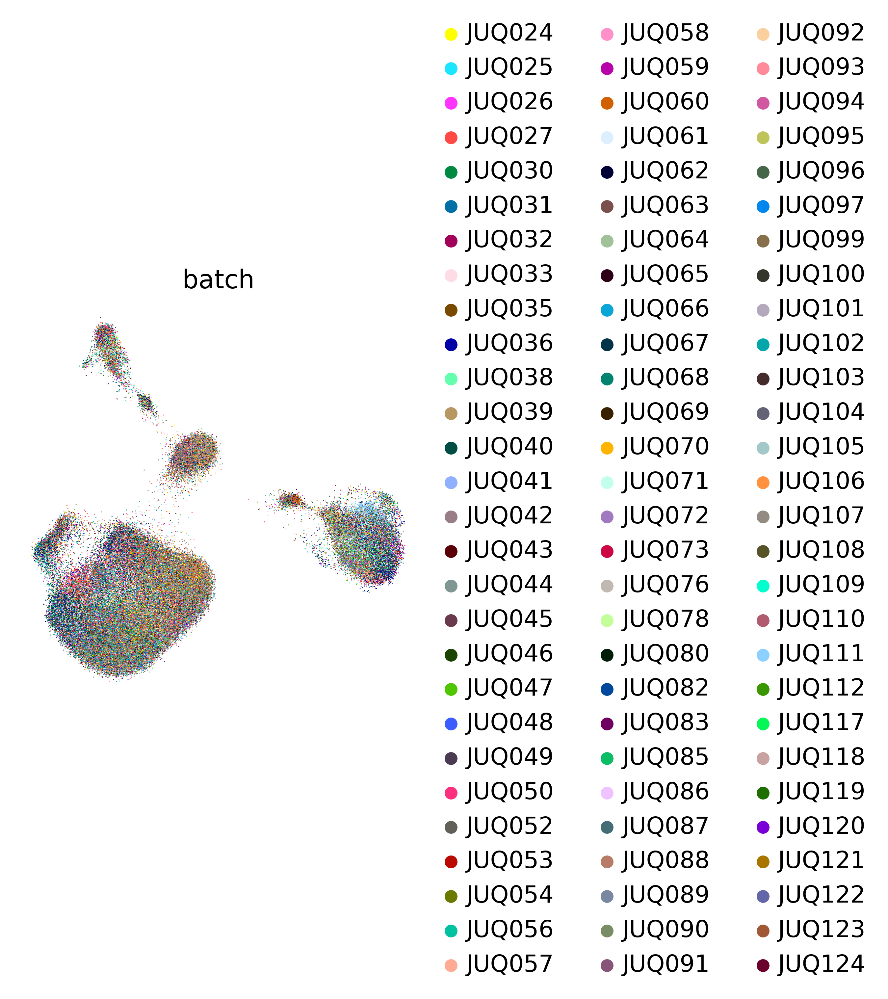

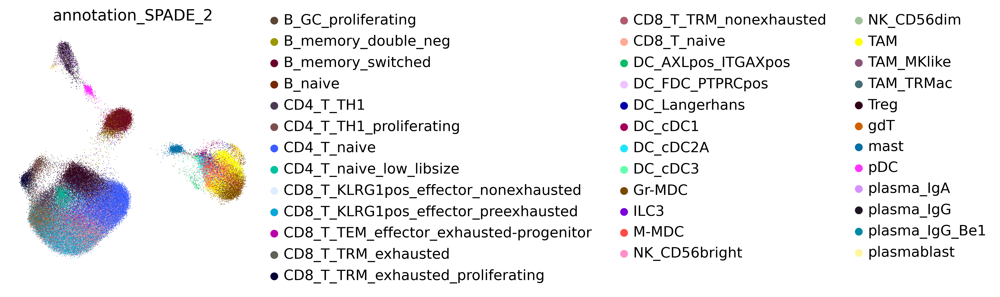

In [56]:
sc.pl.umap(adata, color=['batch'], frameon=False)
sc.pl.umap(adata, color=['annotation_SPADE_2'], frameon=False,palette=subtype_color_dict)

For some models, instead of adding the new nodes in the initial model, we also tried adding new nodes during reference mapping to the same dataset. These results are not in our manuscript because they did not relevantly improve the results.

In [54]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(adata, intr_cvae,
                                                 unfreeze_ext=True,
                                                 new_n_ext=16,
                                                 new_n_ext_m=None,
                                                 #new_ext_mask=query_mask.T,
                                                 new_soft_ext_mask=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 3946 256 1
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 142
	Expanded Mean/Var Layer in/out: 256 16
Decoder Architecture:
	Masked linear layer in, ext_m, ext, cond, out:  142 0 16 1 3946
	with soft mask.
Last Decoder layer: softmax


In [48]:
q_intr_cvae.train(
    n_epochs=250,
    alpha_epoch_anneal=120,
    alpha_kl=0.22,
    weight_decay=0.,
    alpha_l1=0.96,
    gamma_ext=0.7,
    gamma_epoch_anneal=50,
    beta=3.,
    seed=2020,
    use_early_stopping=False
)



Init the L1 proximal operator for the unannotated extension.
 |████████████████████| 100.0%  - val_hsic_loss: 0.6644868371 - val_loss: 1589.1862903942 - val_recon_loss: 1568.2338962307 - val_kl_loss: 86.1769850099


In [49]:
#This adds extension nodes’ names to kang_pbmc.uns['terms'].
q_intr_cvae.update_terms(adata=adata)
q_intr_cvae.latent_directions(adata=adata)

In [ ]:
adata.write(adata_save_path_2)
print('saved to:',adata_save_path_2)

In [51]:
import pickle
with open(model_save_path_2, 'wb') as f:
    pickle.dump(q_intr_cvae, f, pickle.HIGHEST_PROTOCOL)

# Plot

## load data

In [13]:
working_dir ='/path_to_data/'

In [14]:
ALPHA='alphal0.8_4khv'#'0.7_4khvgenes_softmask'#'0.7_4khvgenes' #0#0.7
#adata pre expimap (unfiltered genes)
#adata_path = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded.h5ad'
#
#adata_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha1.h5ad'
#adata_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha1.h5ad'
#model_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha1.pickle'
#model_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha1.pickle'

#adata_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha0.h5ad'
#adata_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha0.h5ad'
#model_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha0.pickle'
#model_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha0.pickle'

#adata_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07.h5ad'
#adata_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07.h5ad'
#model_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07.pickle'
#model_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07.pickle'


#adata_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha1_thresh7genes.h5ad'
#adata_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha1_thresh7genes.h5ad'
#model_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha1_thresh7genes.pickle'
#model_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha1_thresh7genes.pickle'

#adata_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha0_thresh7genes.h5ad'
#adata_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha0_thresh7genes.h5ad'
#model_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha0_thresh7genes.pickle'
#model_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha0_thresh7genes.pickle'

#adata_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes.h5ad'
#adata_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07_thresh7genes.h5ad'
#model_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes.pickle'
#model_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07_thresh7genes.pickle'


#adata_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha1_thresh7genes_4000hvgenes.h5ad'
#adata_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha1_thresh7genes_4000hvgenes.h5ad'
#model_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha1_thresh7genes_4000hvgenes.pickle'
#model_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha1_thresh7genes_4000hvgenes.pickle'

#initial try:
#adata_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes_softmask_alphal04_4khv.h5ad'
###adata_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07_thresh7genes_softmask_alphal04_4khv.h5ad'
#model_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes_softmask_alphal04_4khv.pickle'
###model_path_2 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_query_new-nodes_noalpha07_thresh7genes_softmask_alphal04_4khv.pickle'
 
#new try with only hardmask #doesnt retain tumor reactive
#adata_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes_hardmask.h5ad'
#model_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_nonewnodes_noalpha07_thresh7genes_hardmask.pickle'

#according to Sergei Rybakov's instructions:
adata_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_16newnodes_noalpha07_thresh7genes_softmask_alphal0.8_4khv.h5ad'
model_path_1 = working_dir + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_reembedded_expimap_ref_16newnodes_noalpha07_thresh7genes_softmask_alphal0.8_4khv.pickle'


input_gene_sets = working_dir +'SPADE_genes_x_genesets.csv'
input_spec_gs = working_dir + 'SPADE_cells_x_genesets_celltype-specific_modified_for_SPADE.csv'
input_general_gs = working_dir + 'SPADE_cells_x_genesets_general.csv'

In [15]:
input_df = pd.read_csv(input_gene_sets)
input_df

,gs.name,g.name
0,all_multidrug-resistance,ABCC4
1,all_multidrug-resistance,ABCB4
2,all_multidrug-resistance,ABCC3
3,all_multidrug-resistance,ABCC1
4,all_porphyrine-heme_metabolism,UROS
...,...,...
7855,all_folate_metabolism,SLC19A1
7856,all_folate_metabolism,AMT
7857,all_folate_metabolism,FOLR3
7858,all_folate_metabolism,FTCD


In [16]:
#adata = sc.read(adata_path_2)
adata = sc.read(adata_path_1) #new try

Only considering the two last: ['.8_4khv', '.h5ad'].
Only considering the two last: ['.8_4khv', '.h5ad'].


In [19]:
#with open(model_path_2, 'rb') as f:
#    q_intr_cvae = pickle.load(f)

with open(model_path_1, 'rb') as f:
    q_intr_cvae = pickle.load(f)

In [20]:
inactive_idx = ~q_intr_cvae.model.decoder.nonzero_terms()

In [21]:
print('Inactive terms:')
print([term for i, term in enumerate(adata.uns['terms']) if inactive_idx[i]]
)
len([term for i, term in enumerate(adata.uns['terms']) if inactive_idx[i]])

Inactive terms:
['CD4-T_TH17_UP', 'all_carnitine-shuttle', 'all_retinol_metabolism']


3

## plot

In [23]:
#calculate overlap coefficients for each factor vs every input gene set

overlap_df_expimap = pd.DataFrame()
marker_gene_len = {}

for i in list(adata.uns['terms']):
    marker_gene_len[i] = len(q_intr_cvae.term_genes(i, terms=adata.uns['terms']).index)
    for j in set(input_df['gs.name']):
        set_a = set(input_df[input_df['gs.name']==j]['g.name'])
        set_b = set(q_intr_cvae.term_genes(i, terms=adata.uns['terms']).sort_values(by='weights',ascending=False)['genes'][0:50]) #restrict to top 50 genes to not bias overlap coeff
        min_len = min([len(set_a),len(set_b)])
        if min_len !=0:
            intersect = set_a.intersection(set_b)
            overlap_coeff = len(intersect)/min_len
            overlap_df_expimap.loc[i,j] = overlap_coeff
overlap_df_expimap

,all_ubiquinone_synthesis,all_GABA-shunt,all_pyruvate_metabolism,all_cyclic-nucleotide_metabolism,CD4-T_TFH_UP,all_G2M-transition,all_cholesterol-homeostasis,all_hypoxia-response,all_fatty-acid-metabolism,all_DNA-methylation,...,all_autophagic-cell-death,all_protein-degradation-proteasome,all_heparan-sulfate_degradation,all_mitotic-spindle-component,CD4-T_TH22_UP,all_transmembrane-transport-lysosome,all_transmembrane-transport-ER,all_hyaluronan_metabolism,all_triacylglycerol_synthesis,all_mitophagy
B_effector-1_UP,0.0,0.0,0.0,0.000000,0.125,0.02,0.000000,0.060000,0.020000,0.0,...,0.0,0.080000,0.000000,0.020000,0.142857,0.000000,0.0,0.000000,0.000000,0.00
B_IgM-ligation_response,0.0,0.0,0.0,0.000000,0.000,0.00,0.000000,0.040000,0.000000,0.0,...,0.0,0.080000,0.000000,0.000000,0.142857,0.041667,0.0,0.000000,0.000000,0.00
CD4-T_IL12_response,0.0,0.0,0.0,0.047619,0.000,0.00,0.000000,0.040816,0.020408,0.0,...,0.0,0.061224,0.000000,0.020408,0.142857,0.000000,0.0,0.000000,0.000000,0.00
TNK_IL2_response,0.0,0.0,0.0,0.000000,0.000,0.00,0.028571,0.085714,0.028571,0.0,...,0.0,0.000000,0.000000,0.028571,0.000000,0.000000,0.0,0.000000,0.000000,0.00
TNK_IL2-STAT5-signaling,0.0,0.0,0.0,0.000000,0.000,0.00,0.000000,0.040000,0.000000,0.0,...,0.0,0.000000,0.000000,0.040000,0.000000,0.000000,0.0,0.000000,0.041667,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
unconstrained_11,0.0,0.0,0.0,0.000000,0.125,0.00,0.020000,0.020000,0.020000,0.0,...,0.0,0.040000,0.142857,0.020000,0.000000,0.000000,0.0,0.166667,0.000000,0.04
unconstrained_12,0.0,0.0,0.0,0.000000,0.250,0.00,0.020000,0.080000,0.020000,0.0,...,0.0,0.140000,0.000000,0.020000,0.000000,0.000000,0.0,0.000000,0.000000,0.00
unconstrained_13,0.0,0.0,0.0,0.023810,0.000,0.00,0.000000,0.120000,0.000000,0.0,...,0.0,0.140000,0.000000,0.100000,0.000000,0.000000,0.0,0.000000,0.000000,0.04
unconstrained_14,0.0,0.0,0.0,0.000000,0.000,0.00,0.000000,0.080000,0.040000,0.0,...,0.0,0.100000,0.000000,0.080000,0.000000,0.041667,0.0,0.000000,0.000000,0.08


In [24]:
#save df
overlap_df_expimap.to_csv(working_dir+'Bassez_expimap_overlap_df_alpha{}.csv'.format(ALPHA))
print('saved to:','Bassez_expimap_overlap_df_alpha{}.csv'.format(ALPHA))

saved to: Bassez_expimap_overlap_df_alphaalphal0.8_4khv.csv


In [26]:
expimap_series = pd.Series(np.max(overlap_df_expimap,axis=1).reset_index()[0])
expimap_series.index = ['expimap']*len(expimap_series)
expimap_series

expimap    0.555556
expimap    0.333333
expimap    1.000000
expimap    0.894737
expimap    0.960000
             ...   
expimap    0.166667
expimap    0.250000
expimap    0.142857
expimap    0.166667
expimap    0.200000
Name: 0, Length: 155, dtype: float64

In [28]:
q_intr_cvae.term_genes('unconstrained_1', terms=adata.uns['terms'])

,genes,weights,in_mask
0,TNFSF9,-1.385835e-06,False
1,LTA,-7.022878e-07,False
2,IL2,-6.831000e-07,False
3,CCP110,-4.163521e-07,False
4,PLOD3,-3.532567e-07,False
5,HDAC1,-3.409050e-07,False
6,ERLIN2,-2.844967e-07,False
7,SSR1,-2.623559e-07,False
8,PIM1,-2.613106e-07,False
9,METTL1,-2.551379e-07,False


In [29]:
#dataframe of marker genes
expimap_marker_list = []
columns =[]
for i in list(adata.uns['terms']):
    columns.append(i)
    expimap_marker_list.append(list(q_intr_cvae.term_genes(i, terms=adata.uns['terms'])['genes']))
    
    
expimap_marker_df = pd.DataFrame(expimap_marker_list).T
expimap_marker_df.columns = columns
expimap_marker_df

,B_effector-1_UP,B_IgM-ligation_response,CD4-T_IL12_response,TNK_IL2_response,CD4-T_TH17_UP,TNK_IL2-STAT5-signaling,T_IL21_response,CD4-T_TH9_UP,CD4-T_TFH_UP,CD4-T_IL4_response,...,unconstrained_6,unconstrained_7,unconstrained_8,unconstrained_9,unconstrained_10,unconstrained_11,unconstrained_12,unconstrained_13,unconstrained_14,unconstrained_15
0,IFNG,ASPM,LCP1,GSTA4,None,CTLA4,TNFSF9,TNFSF9,TNFSF9,TNFSF9,...,PCBD1,ALDH2,TNFSF9,PCBD1,TNFSF9,TNFSF9,TNFSF9,TNFSF9,TNFSF9,TNFSF9
1,FCGR3A,DLGAP5,IFNG,PIK3AP1,None,TNFRSF18,NECAP2,IL2,CD84,IL2,...,PPP1R12A,PLAC8,PCBD1,USP6NL,IL2,IL2,IL2,IL2,USP6NL,IL2
2,TIFAB,MKI67,DAB2,PCBD1,None,TNFRSF4,IFITM3,ALDH2,PGLS,CLU,...,SDC3,USP6NL,FARP1,PLAC8,GADD45A,DMAC2,LTA,IFNG,RAB8A,SLC1A5
3,CD74,TOP2A,PCBD1,VDR,None,ICOS,PSMD6,RBPJ,ALDH3A2,ARID5A,...,FARP1,TIFAB,ISCU,CCL4L2,PCBD1,GADD45A,NME3,PCBD1,HLA-DRB5,NR1D1
4,ALDH2,CCNA2,PDGFRA,NANP,None,TNFRSF21,PMEPA1,CUL1,ALDH2,FBXL17,...,TRIM65,CCL4L2,IL2,C1QB,COX6B1,RBPJ,GADD45A,SLC26A11,PRDX6,ALDH2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1251,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1252,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1253,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1254,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [30]:
#df containing global input gene sets
input_glob = pd.read_csv(input_general_gs)
input_glob

,gs.name,c.name
0,all_multidrug-resistance,all-cells
1,all_porphyrine-heme_metabolism,all-cells
2,all_TNF-via-NFkB_signaling,all-cells
3,all_glyoxylate-dicarboxylate_metabolism,all-cells
4,all_IL6-JAK-STAT3_signaling,all-cells
...,...,...
145,all_ethanol_metabolism,all-cells
146,all_taurine-hypotaurine_metabolism,all-cells
147,all_glycerophospholipid_metabolism,all-cells
148,all_complement_production,all-cells


In [38]:
#df containing specific gene sets
input_spec = pd.read_csv(input_spec_gs)
input_spec

,gs.name,c.name
0,CD8-T_tumor-reactive-like_UP,CD8_T
1,DC_antigen-crosspresentation,DC
2,CD8-T_terminal-exhaustion,CD8_T
3,B_Breg_UP,B_memory
4,M_angiogenic-effectors,MDC
5,CD4-T_IL12_response,CD4_T
6,TNK_IL2_response,CD4_T
7,T_tcr-activation,CD8_T
8,CD4-T_TH22_UP,CD4_T
9,Mac_LPS_response,MDC


In [39]:
#get background markers (identical to Spectra preprocessing)
vocab = list(adata[:,adata.var['highly_variable']].var_names)

In [ ]:
#enrich gs for expimap
import gseapy
#factor_dict = adata_expimap.uns['SPADE_markers_specific']['CD8_T'] | adata_expimap.uns['SPADE_markers_global']
factor_dict = {}
for i in expimap_marker_df.columns:
    genes = [x for x in expimap_marker_df[i] if x != None]
    if len(genes)<=50:
        factor_dict[i] =genes
    else:
        factor_dict[i] =genes[0:50]
    
#gene_sets_of_interest = list(input_glob['gs.name']) + list(input_spec[input_spec['c.name']=='CD8_T']['gs.name'])
gene_sets_of_interest = list(input_glob['gs.name']) + list(input_spec['gs.name'])
#restrict to spec number of makers 
factor_dict = {k:v[0:50] for k,v in factor_dict.items()}
factor_dict = {k:v for k,v in factor_dict.items() if len(v)>0}

all_gs = {}
for i in set(input_df['gs.name']):
    if i in gene_sets_of_interest:
        all_gs[i]= list(input_df[input_df['gs.name']==i]['g.name'])


enr_df_expimap,enr_dict_expimap = enrich_factors(all_gs, factor_dict, background=vocab)

In [41]:
#prepare data for plotting (expimap)
factors_of_interest = ['all_LYS_metabolism', 'all_LYS_metabolism']
enr_df_factor_sub = enr_df_expimap[enr_df_expimap['Term'].isin(factors_of_interest)]#[['Odds Ratio','Adjusted P-value']]

enr_df_factor_plot = pd.DataFrame()

for i in set(enr_df_factor_sub['factor']):
    enr_df_factor_sub_fac = enr_df_factor_sub[enr_df_factor_sub['factor']==i].set_index('Term')
    if 'all_LYS_metabolism' in enr_df_factor_sub_fac.index and 'all_LYS_metabolism' not in enr_df_factor_sub_fac.index:
            enr_df_factor_plot.loc[i,'all_LYS_metabolism'] = enr_df_factor_sub_fac.loc['all_LYS_metabolism','Odds Ratio']
            enr_df_factor_plot.loc[i,'all_LYS_metabolism_p'] = enr_df_factor_sub_fac.loc['all_LYS_metabolism','Adjusted P-value']
            enr_df_factor_plot.loc[i,'all_LYS_metabolism_p'] = 1
            enr_df_factor_plot.loc[i,'all_LYS_metabolism'] = 1
    elif 'all_LYS_metabolism' not in enr_df_factor_sub_fac.index and 'all_LYS_metabolism'in enr_df_factor_sub_fac.index:
            enr_df_factor_plot.loc[i,'all_LYS_metabolism'] =1
            enr_df_factor_plot.loc[i,'all_LYS_metabolism_p'] = 1
            enr_df_factor_plot.loc[i,'all_LYS_metabolism_p'] = enr_df_factor_sub_fac.loc['all_LYS_metabolism','Adjusted P-value']
            enr_df_factor_plot.loc[i,'all_LYS_metabolism'] = enr_df_factor_sub_fac.loc['all_LYS_metabolism','Odds Ratio']
    elif 'all_LYS_metabolism' in enr_df_factor_sub_fac.index and 'all_LYS_metabolism'in enr_df_factor_sub_fac.index:
            enr_df_factor_plot.loc[i,'all_LYS_metabolism'] =enr_df_factor_sub_fac.loc['all_LYS_metabolism','Odds Ratio']   
            enr_df_factor_plot.loc[i,'all_LYS_metabolism_p'] = enr_df_factor_sub_fac.loc['all_LYS_metabolism','Adjusted P-value']
            enr_df_factor_plot.loc[i,'all_LYS_metabolism_p'] = enr_df_factor_sub_fac.loc['all_LYS_metabolism','Adjusted P-value']
            enr_df_factor_plot.loc[i,'all_LYS_metabolism'] = enr_df_factor_sub_fac.loc['all_LYS_metabolism','Odds Ratio']   
    else:
        print('skipping',i)

enr_df_factor_plot_expimap = enr_df_factor_plot
enr_df_factor_plot_expimap

,all_LYS_metabolism,all_LYS_metabolism_p
Mac_IFNG_response,8.218391,3.820780e-01
all_fructose-mannose_metabolism,8.564428,4.956521e-01
B_effector-1_UP,8.218391,3.942075e-01
all_glycerin-SER-THR_metabolism,13.979737,5.997246e-02
all_platelet-activation-factor_production,8.564428,4.710893e-01
all_NAD_metabolism,9.351962,3.960977e-01
all_o-glycan_synthesis,12.517241,3.772362e-01
CD4-T_TFH_UP,8.218391,3.589854e-01
all_NOTCH_signaling,8.218391,3.878236e-01
all_G1S-transition,8.218391,3.652834e-01


In [42]:
#concatenate dataframes from from different methods to one (not really needed here just for consistency with code from other notebooks)
import math
enr_df_factor_plot_expimap['method'] = len(enr_df_factor_plot_expimap)*['expimap']
enr_df_factor_plot_merge = pd.concat([enr_df_factor_plot_expimap])
enr_df_factor_plot_merge['all_LYS_metabolism_10log(1/pval)'] = enr_df_factor_plot_merge['all_LYS_metabolism_p'].apply(lambda x: math.log(1/x, 10))
enr_df_factor_plot_merge

,all_LYS_metabolism,all_LYS_metabolism_p,method,all_LYS_metabolism_10log(1/pval)
Mac_IFNG_response,8.218391,3.820780e-01,expimap,0.417848
all_fructose-mannose_metabolism,8.564428,4.956521e-01,expimap,0.304823
B_effector-1_UP,8.218391,3.942075e-01,expimap,0.404275
all_glycerin-SER-THR_metabolism,13.979737,5.997246e-02,expimap,1.222048
all_platelet-activation-factor_production,8.564428,4.710893e-01,expimap,0.326897
all_NAD_metabolism,9.351962,3.960977e-01,expimap,0.402198
all_o-glycan_synthesis,12.517241,3.772362e-01,expimap,0.423387
CD4-T_TFH_UP,8.218391,3.589854e-01,expimap,0.444923
all_NOTCH_signaling,8.218391,3.878236e-01,expimap,0.411366
all_G1S-transition,8.218391,3.652834e-01,expimap,0.437370


saved to: Bassez_tumorreac_exhaustion_GSEA_factors_LYS_expimap_alphal0.8_4khv.svg


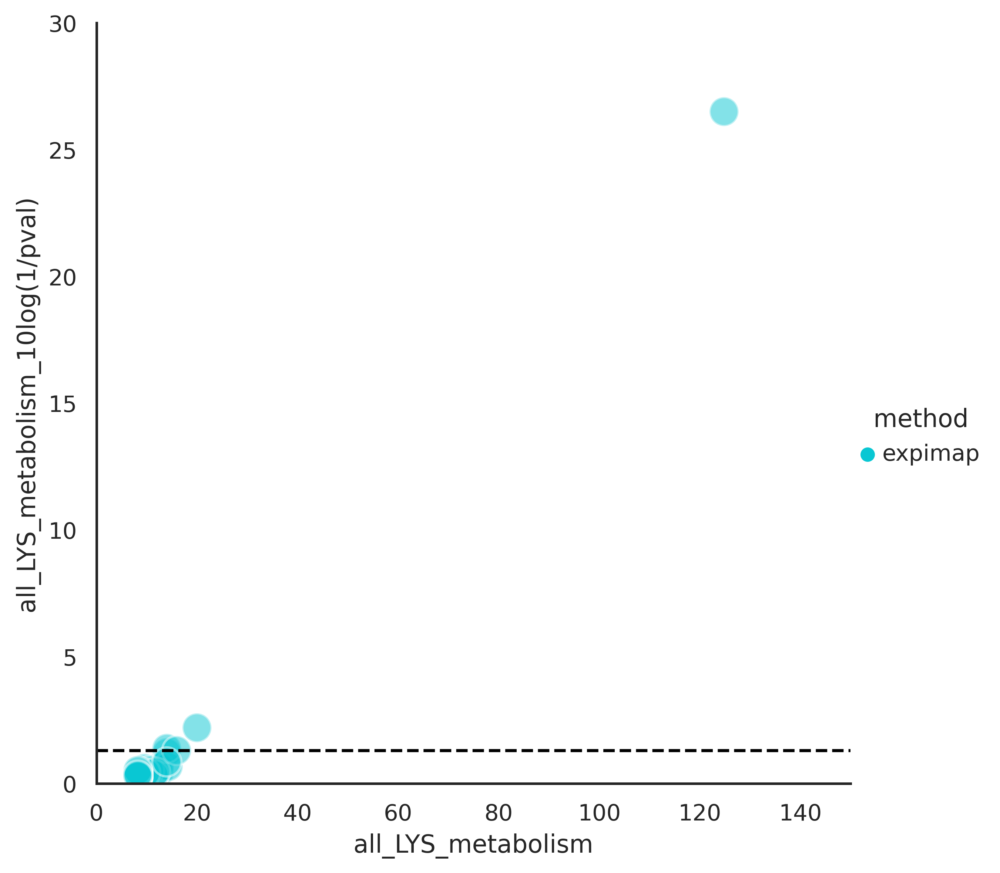

In [44]:
import seaborn as sns
sns.set_theme(style="white")
save_name = 'Bassez_tumorreac_exhaustion_GSEA_factors_LYS_expimap_{}.svg'.format(ALPHA)

sns.relplot(x="all_LYS_metabolism", y="all_LYS_metabolism_10log(1/pval)", hue="method", s=200,
            alpha=0.5,palette=['#09C7D3'],
            height=6, data=enr_df_factor_plot_merge[enr_df_factor_plot_merge['method']=='expimap'])
plt.xlim(0,150)
plt.ylim(0,30)
plt.axhline(math.log(1/0.05,10),color='#000000',linestyle='--')
plt.savefig(fig_save_path + save_name)
print('saved to:',save_name)

In [ ]:
#enrich gs for expimap
import gseapy
#factor_dict = adata_expimap.uns['SPADE_markers_specific']['CD8_T'] | adata_expimap.uns['SPADE_markers_global']
factor_dict = {}
for i in expimap_marker_df.columns:
    genes = [x for x in expimap_marker_df[i] if x != None]
    if len(genes)<=50:
        factor_dict[i] =genes
    else:
        factor_dict[i] =genes[0:50]
    
#gene_sets_of_interest = list(input_glob['gs.name']) + list(input_spec[input_spec['c.name']=='CD8_T']['gs.name'])
gene_sets_of_interest = list(input_glob['gs.name']) + list(input_spec['gs.name'])
#restrict to spec number of makers 
factor_dict = {k:v[0:50] for k,v in factor_dict.items()}
factor_dict = {k:v for k,v in factor_dict.items() if len(v)>0}

all_gs = {}
for i in set(input_df['gs.name']):
    if i in gene_sets_of_interest:
        all_gs[i]= list(input_df[input_df['gs.name']==i]['g.name'])


enr_df_expimap,enr_dict_expimap = enrich_factors(all_gs, factor_dict, background=vocab)

In [46]:
#prepare data for plotting (expimap)
factors_of_interest = ['CD8-T_tumor-reactive-like_UP', 'CD8-T_terminal-exhaustion']
enr_df_factor_sub = enr_df_expimap[enr_df_expimap['Term'].isin(factors_of_interest)]#[['Odds Ratio','Adjusted P-value']]

enr_df_factor_plot = pd.DataFrame()

for i in set(enr_df_factor_sub['factor']):
    enr_df_factor_sub_fac = enr_df_factor_sub[enr_df_factor_sub['factor']==i].set_index('Term')
    if 'CD8-T_terminal-exhaustion' in enr_df_factor_sub_fac.index and 'CD8-T_tumor-reactive-like_UP' not in enr_df_factor_sub_fac.index:
            enr_df_factor_plot.loc[i,'CD8-T_terminal-exhaustion'] = enr_df_factor_sub_fac.loc['CD8-T_terminal-exhaustion','Odds Ratio']
            enr_df_factor_plot.loc[i,'CD8-T_terminal-exhaustion_p'] = enr_df_factor_sub_fac.loc['CD8-T_terminal-exhaustion','Adjusted P-value']
            enr_df_factor_plot.loc[i,'CD8-T_tumor-reactive-like_UP_p'] = 1
            enr_df_factor_plot.loc[i,'CD8-T_tumor-reactive-like_UP'] = 1
    elif 'CD8-T_terminal-exhaustion' not in enr_df_factor_sub_fac.index and 'CD8-T_tumor-reactive-like_UP'in enr_df_factor_sub_fac.index:
            enr_df_factor_plot.loc[i,'CD8-T_terminal-exhaustion'] =1
            enr_df_factor_plot.loc[i,'CD8-T_terminal-exhaustion_p'] = 1
            enr_df_factor_plot.loc[i,'CD8-T_tumor-reactive-like_UP_p'] = enr_df_factor_sub_fac.loc['CD8-T_tumor-reactive-like_UP','Adjusted P-value']
            enr_df_factor_plot.loc[i,'CD8-T_tumor-reactive-like_UP'] = enr_df_factor_sub_fac.loc['CD8-T_tumor-reactive-like_UP','Odds Ratio']
    elif 'CD8-T_terminal-exhaustion' in enr_df_factor_sub_fac.index and 'CD8-T_tumor-reactive-like_UP'in enr_df_factor_sub_fac.index:
            enr_df_factor_plot.loc[i,'CD8-T_terminal-exhaustion'] =enr_df_factor_sub_fac.loc['CD8-T_terminal-exhaustion','Odds Ratio']   
            enr_df_factor_plot.loc[i,'CD8-T_terminal-exhaustion_p'] = enr_df_factor_sub_fac.loc['CD8-T_terminal-exhaustion','Adjusted P-value']
            enr_df_factor_plot.loc[i,'CD8-T_tumor-reactive-like_UP_p'] = enr_df_factor_sub_fac.loc['CD8-T_tumor-reactive-like_UP','Adjusted P-value']
            enr_df_factor_plot.loc[i,'CD8-T_tumor-reactive-like_UP'] = enr_df_factor_sub_fac.loc['CD8-T_tumor-reactive-like_UP','Odds Ratio']   
    else:
        print('skipping',i)

enr_df_factor_plot_expimap = enr_df_factor_plot

In [47]:
#concatenate dataframes from from different methods to one (not really needed here just for consistency with code from other notebooks)
import math
enr_df_factor_plot_expimap['method'] = len(enr_df_factor_plot_expimap)*['expimap']
enr_df_factor_plot_merge = pd.concat([enr_df_factor_plot_expimap])
enr_df_factor_plot_merge['tumor_reac_10log(1/pval)'] = enr_df_factor_plot_merge['CD8-T_tumor-reactive-like_UP_p'].apply(lambda x: math.log(1/x, 10))
enr_df_factor_plot_merge['exhaust_10log(1/pval)'] = enr_df_factor_plot_merge['CD8-T_terminal-exhaustion_p'].apply(lambda x: math.log(1/x, 10))
enr_df_factor_plot_merge

,CD8-T_terminal-exhaustion,CD8-T_terminal-exhaustion_p,CD8-T_tumor-reactive-like_UP_p,CD8-T_tumor-reactive-like_UP,method,tumor_reac_10log(1/pval),exhaust_10log(1/pval)
B_effector-1_UP,8.829405,3.824490e-01,3.505211e-01,14.040998,expimap,0.455286,0.417426
TNK_PD-1_signaling,1.000000,1.000000e+00,4.059873e-01,14.040998,expimap,0.391488,0.000000
all_nucleotide_metabolism,1.000000,1.000000e+00,2.094963e-01,21.385520,expimap,0.678824,0.000000
all_NAD_metabolism,1.000000,1.000000e+00,3.960977e-01,15.977688,expimap,0.402198,0.000000
all_porphyrine-heme_metabolism,1.000000,1.000000e+00,2.330830e-01,15.977688,expimap,0.632489,0.000000
all_G2M-transition,1.000000,1.000000e+00,4.136785e-01,14.040998,expimap,0.383337,0.000000
all_TGFb_response,8.829405,5.813225e-01,1.000000e+00,1.000000,expimap,0.000000,0.235583
all_TNF-via-NFkB_signaling,21.469396,2.575775e-03,1.000000e+00,1.000000,expimap,0.000000,2.589092
all_ALA-ASP_metabolism,13.447863,2.193377e-01,1.000000e+00,1.000000,expimap,0.000000,0.658887
all_SASP,8.829405,2.433766e-01,1.314256e-02,23.884172,expimap,1.881320,0.613721


saved to: Bassez_tumorreac_exhaustion_GSEA_factors_expimap_alphal0.8_4khv.svg


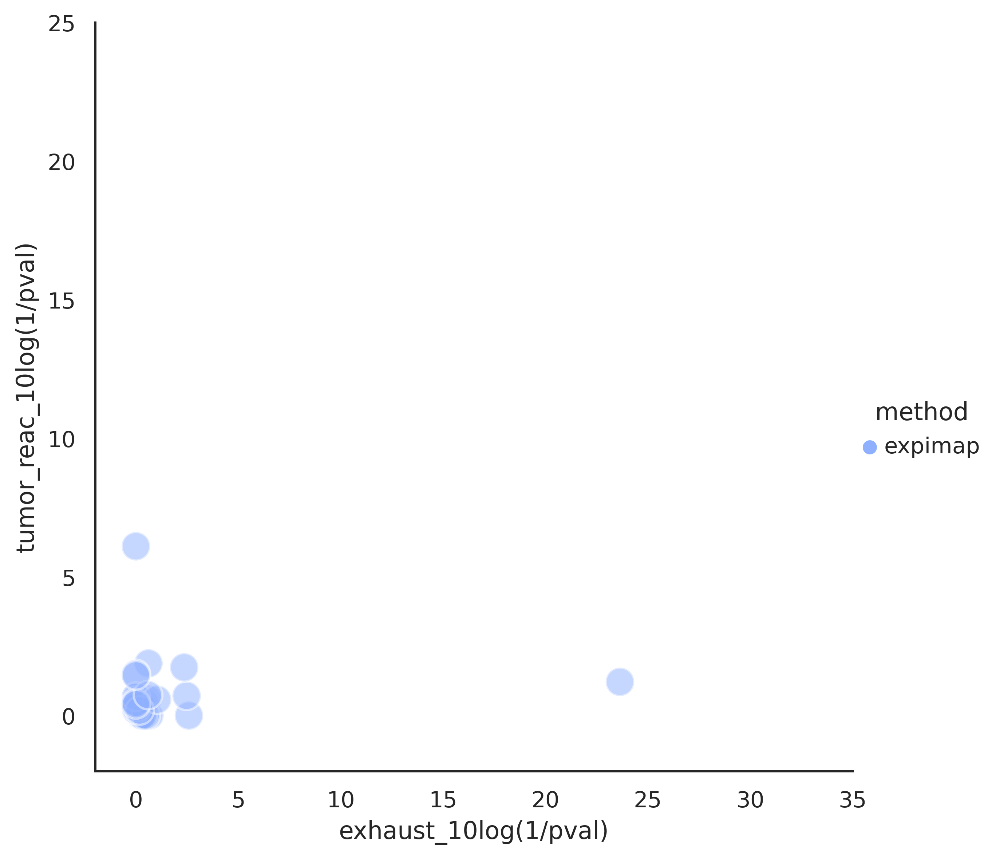

In [48]:
import seaborn as sns
sns.set_theme(style="white")
save_name = 'Bassez_tumorreac_exhaustion_GSEA_factors_expimap_{}.svg'.format(ALPHA)

sns.relplot(x="exhaust_10log(1/pval)", y="tumor_reac_10log(1/pval)", hue="method", s=200,
            alpha=0.5,palette=['#8FB0FF'],
            height=6, data=enr_df_factor_plot_merge[enr_df_factor_plot_merge['method']=='expimap'])
plt.xlim(-2,35)
plt.ylim(-2,25)
plt.savefig(fig_save_path + save_name)
print('saved to:',save_name)

In [49]:
enr_df_factor_plot_merge[enr_df_factor_plot_merge['method']=='expimap']

,CD8-T_terminal-exhaustion,CD8-T_terminal-exhaustion_p,CD8-T_tumor-reactive-like_UP_p,CD8-T_tumor-reactive-like_UP,method,tumor_reac_10log(1/pval),exhaust_10log(1/pval)
B_effector-1_UP,8.829405,3.824490e-01,3.505211e-01,14.040998,expimap,0.455286,0.417426
TNK_PD-1_signaling,1.000000,1.000000e+00,4.059873e-01,14.040998,expimap,0.391488,0.000000
all_nucleotide_metabolism,1.000000,1.000000e+00,2.094963e-01,21.385520,expimap,0.678824,0.000000
all_NAD_metabolism,1.000000,1.000000e+00,3.960977e-01,15.977688,expimap,0.402198,0.000000
all_porphyrine-heme_metabolism,1.000000,1.000000e+00,2.330830e-01,15.977688,expimap,0.632489,0.000000
all_G2M-transition,1.000000,1.000000e+00,4.136785e-01,14.040998,expimap,0.383337,0.000000
all_TGFb_response,8.829405,5.813225e-01,1.000000e+00,1.000000,expimap,0.000000,0.235583
all_TNF-via-NFkB_signaling,21.469396,2.575775e-03,1.000000e+00,1.000000,expimap,0.000000,2.589092
all_ALA-ASP_metabolism,13.447863,2.193377e-01,1.000000e+00,1.000000,expimap,0.000000,0.658887
all_SASP,8.829405,2.433766e-01,1.314256e-02,23.884172,expimap,1.881320,0.613721


In [50]:
exhaustion_factor = enr_df_factor_plot_merge[enr_df_factor_plot_merge['method']=='expimap']['exhaust_10log(1/pval)'].sort_values().index[-1]
tumor_reac_factor = enr_df_factor_plot_merge[enr_df_factor_plot_merge['method']=='expimap']['tumor_reac_10log(1/pval)'].sort_values().index[-1]  
print('factor with highest overlap with exhaustion:',exhaustion_factor)
print('factor with highest overlap with tumor reactivity:',tumor_reac_factor)

factor with highest overlap with exhaustion: CD8-T_terminal-exhaustion
factor with highest overlap with tumor reactivity: CD8-T_tumor-reactive-like_UP


In [55]:
q_intr_cvae.get_latent()

array([[-0.92,  0.73, -2.63,  0.14, -0.12, -2.89, -0.62, ...,  0.13,
         0.06, -1.29, -0.03, -0.23,  0.96,  1.19],
       [ 0.75, -0.19,  0.4 , -0.48, -0.98,  0.36,  0.36, ..., -0.95,
        -0.87,  0.55,  1.2 , -1.74,  0.91, -0.68],
       [ 0.04,  3.08, -0.81, -0.67,  1.41, -0.26,  0.21, ...,  0.13,
         0.64,  0.4 ,  0.06,  1.37,  0.69, -1.43],
       [ 1.64,  0.18,  0.47, -1.3 ,  0.71,  0.67,  0.29, ...,  0.62,
        -0.14, -0.08, -0.74,  0.01,  0.38,  0.18],
       [ 0.21, -3.99, -0.32, -0.46, -1.34,  1.89,  1.37, ..., -1.89,
         2.33,  1.1 ,  1.42, -0.56,  1.08,  0.1 ],
       [-2.63,  0.66, -0.48, -0.12, -0.19,  0.28,  0.95, ..., -0.59,
         1.37,  1.58, -1.07, -0.55,  0.46,  0.06],
       [ 0.71,  0.35,  0.87, -0.66,  0.28,  0.11,  0.25, ...,  1.41,
         1.34,  0.16, -0.16, -0.34, -2.19, -0.6 ],
       ...,
       [-1.84,  0.79, -2.05,  0.9 ,  0.56, -0.32,  0.29, ...,  0.67,
         0.04,  0.25, -1.53, -1.48,  0.5 , -1.37],
       [-0.73, -0.23,  0.67,

In [33]:
q_intr_cvae.latent_directions(adata=adata)

In [34]:
#add latents to obs
terms = list(adata.uns['terms'])
select_terms = list(adata.uns['terms'])
idx = [terms.index(term) for term in select_terms]

latents = (q_intr_cvae.get_latent(adata.X, adata.obs['study'], mean=False) * adata.uns['directions'])[:, idx]


for i,v in enumerate(select_terms):
    adata.obs[v] = latents[:, i]

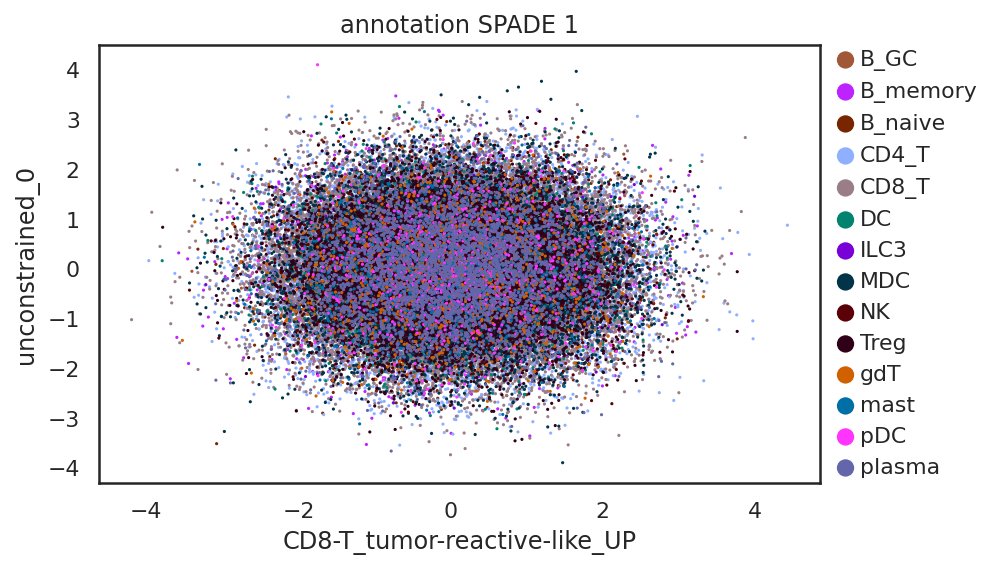

In [58]:
%matplotlib inline
sc.pl.scatter(adata, x=tumor_reac_factor, y='unconstrained_0',#exhaustion_factor, 
              color='annotation_SPADE_1', size=10)


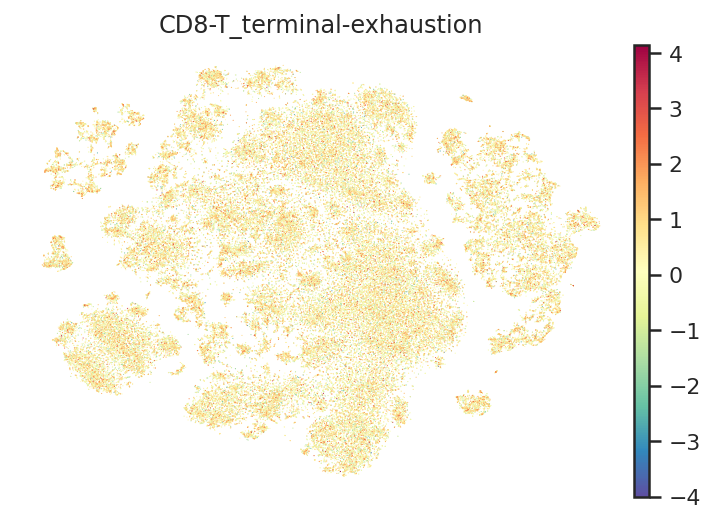

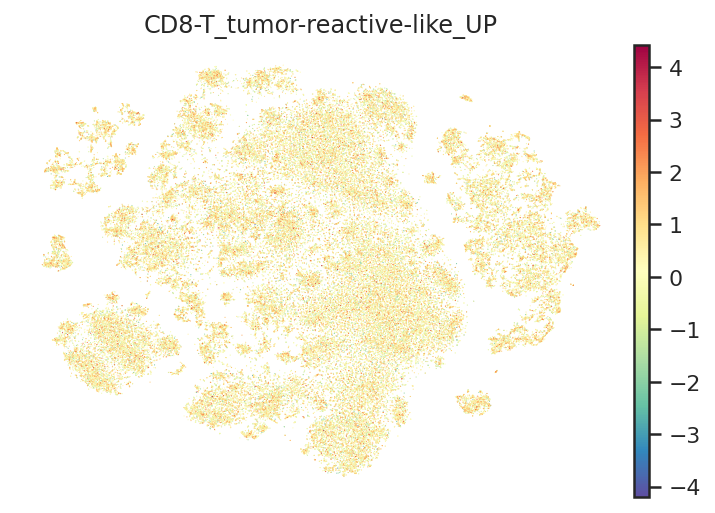

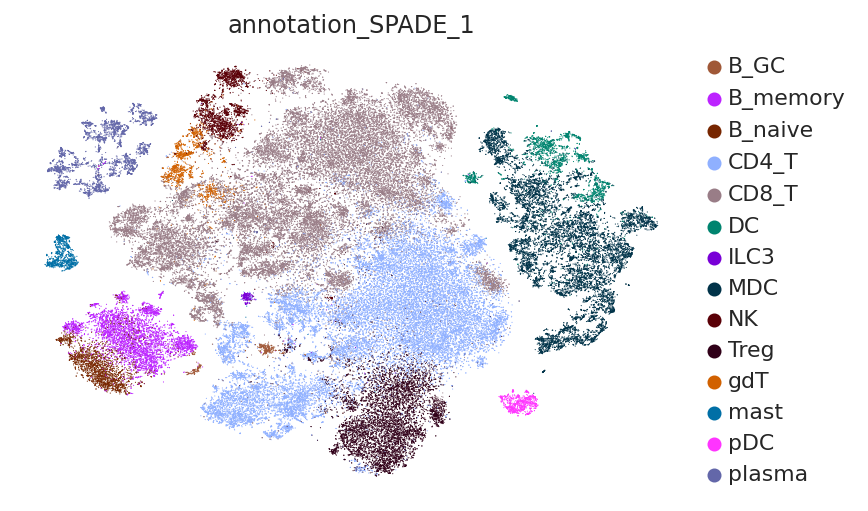

In [59]:
#sc.pl.umap(adata, color=[exhaustion_factor], frameon=False) 
sc.pl.tsne(adata, color=['CD8-T_terminal-exhaustion'], frameon=False,cmap='Spectral_r') 
#sc.pl.umap(adata, color=[tumor_reac_factor], frameon=False)
sc.pl.tsne(adata, color=['CD8-T_tumor-reactive-like_UP'], frameon=False,cmap='Spectral_r') 
sc.pl.tsne(adata, color=['annotation_SPADE_1'], frameon=False,palette=subtype_color_dict)

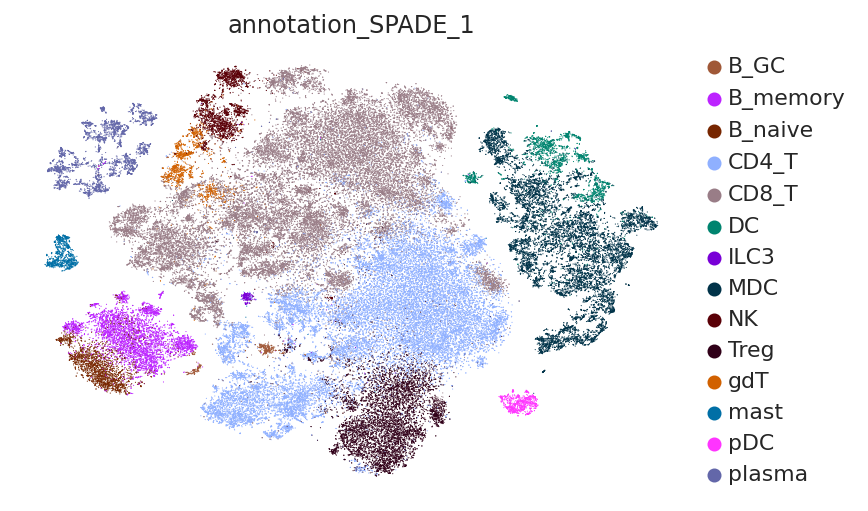

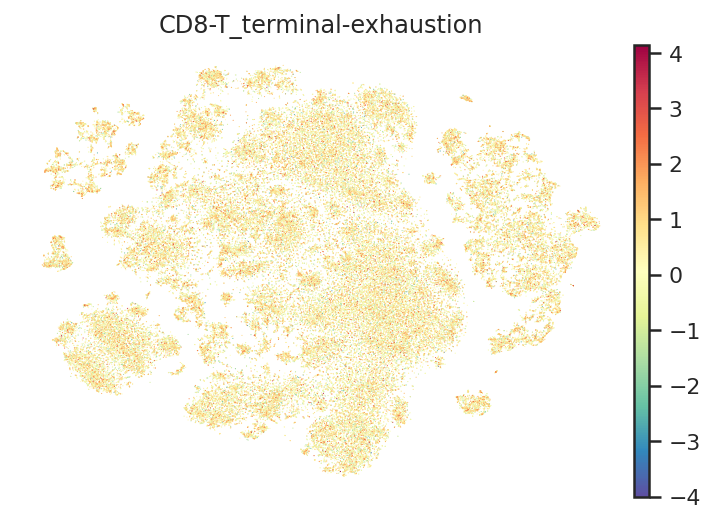

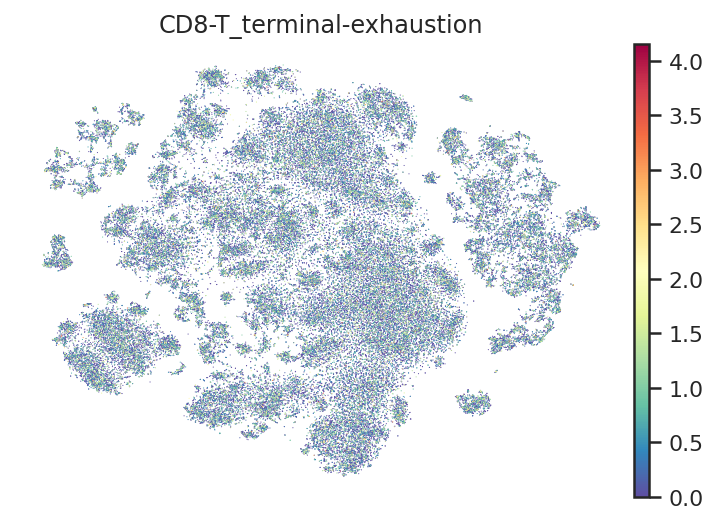

In [60]:
sc.pl.tsne(adata, color=['annotation_SPADE_1'], frameon=False,palette=subtype_color_dict)
sc.pl.tsne(adata, color=[exhaustion_factor], frameon=False,cmap='Spectral_r',save='Expimap_default_exhaustion_nothresh_alpha{}.svg'.format(ALPHA))
sc.pl.tsne(adata, color=[exhaustion_factor], frameon=False,cmap='Spectral_r',vmin=0,save='Expimap_default_exhaustion_thresh_alpha{}.svg'.format(ALPHA))

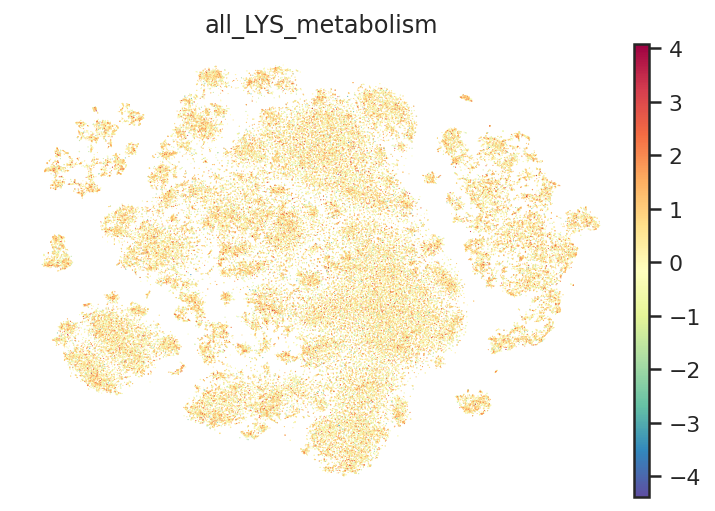

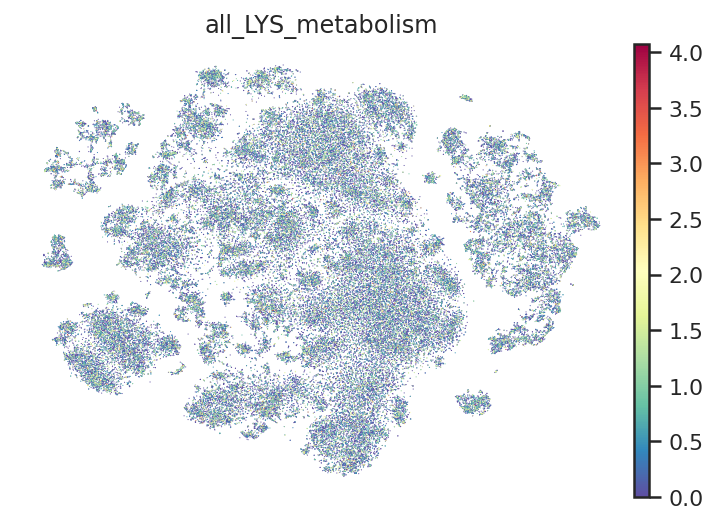

In [61]:
sc.pl.tsne(adata, color=['all_LYS_metabolism'], frameon=False,cmap='Spectral_r',save='Expimap_default_LYS_nothresh_alpha{}.svg'.format(ALPHA))
sc.pl.tsne(adata, color=['all_LYS_metabolism'], frameon=False,cmap='Spectral_r',vmin=0,save='Expimap_default_LYS_thresh_alpha{}.svg'.format(ALPHA))

In [66]:
#dict for model constructed according to Sergei Rybakov's instructions
marker_dict ={'AADAT':'LYS_metabolism',
 'AASS':'LYS_metabolism',
 'ACADVL':'lipid_metabolism',
 'ALDH2':'LYS_metabolism',
 'ALDH7A1':'LYS_metabolism',
 'ARF6':'signaling',
 'BBOX1':'LYS_metabolism',
 'BLCAP':'apoptosis',
 'CCP110':'cell_cycle',
 'ERH':'other',
 'GADD45A':'other',
 'GCDH':'LYS_metabolism',
 'GTF2H1':'transcriptional-regulator',
 'HSD17B7':'lipid_metabolism',
 'IL2':'cytokine',
 'JUNB':'transcription_factor',
 'MAP2K7':'signaling',
 'NCL':'ribosomes',
 'NDUFA8':'oxphos',
 'NINJ1':'adhesion',
 'PCBD1':'metabolism',
 'PIAS3':'ubiquitin',
 'PIM1':'signaling',
 'PIPOX':'LYS_metabolism',
 'PLEKHF1':'autophagy',
 'PLOD3':'ECM',
 'RAB27A':'signaling',
 'RAD9A':'cell_cycle',
 'RELA':'transcription_factor',
 'RNF19A':'ubiquitin',
 'SLC3A1':'LYS_metabolism',
 'SLC7A1':'LYS_metabolism',
 'SLC7A2':'LYS_metabolism',
 'SPCS1':'LYS_metabolism',
 'SPCS2':'LYS_metabolism',
 'SPCS3':'LYS_metabolism',
 'STK40':'signaling',
 'TMLHE':'LYS_metabolism',
 'TNFAIP8':'apoptosis',
 'TNFSF9':'immune-checkpoint',
 'TRIM21':'ubiquitin',
 'TRIM5':'ubiquitin',
 'ZC3H12A':'transcriptional-regulator',
 'ZFP36':'other',
 'ZNRD1':'transcription'}

In [67]:
color_dict = { 'ER_protein_synthesis':'#1CE6FF',
              'transcriptional-regulator':'#2CE6FF',
              'apoptosis':'#009FA6',
              'endocytosis':'#74FFAC',
 'ER_stress':'#FF34FF',
 'LYS_metabolism':'#FF4A46',
 'NFkB_signaling': '#008941',
 'Notch_signaling':'#006FA6',
 'Ras_signaling': '#A30059',
 'VitB6_metabolism': '#7A4900',
 'aberrant':'#0000A6',
 'adhesion':'#63FFAC',
 'autophagy': '#B79762',
 'calcium_signaling': '#004D43',
 'cell_cycle': '#8FB0FF',
 'chemotaxis':'#997D87',
 'cholesterol_metabolism':'#5A0007',
               'ECM':'#5A0020',
 'creatinine_metabolism': '#809693',
 'cytoskeleton': '#1B4400',
 'development': '#4FC601',
              'ribosomes': '#4FC605',
              'oxphos': '#4FC620',
 'differentiation': '#3B5DFF',
 'disulfide_bond':'#4A3B53',
 'glutathione_metabolism':'#FF2F80',
 'glycolipid_metabolism':'#61615A',
 'hypoxia':'#BA0900',
 'ion_channel': '#6B7900',
 'lipid_metabolism':'#00C2A0',
 'marker':'#FFAA92',
 'non-coding': '#FF90C9',
              'PAMPR':'#f8a487',
 'phospholipid_metabolism': '#B903AA',
 'proliferation': '#D16100',
 'proline_metabolism': '#DDEFFF',
 'protein_glycosylation': '#000035',
 'protein_synthesis':'#7B4F4B',
 'signaling': '#A1C299',
 'survival': '#300018',
 'transcription': '#0AA6D8',
 'transcription_factor': '#013349',
 'unknown': '#00846F',
 'urea_cycle': '#372101',
             'cytokine':'#235f5f',
             'immune-checkpoint':'#f8b5be',
             'cytokine_receptor':'#eecbe1',
             'metabolism':'#757e36',
             'extracellular_matrix':'#1d2356',
             'coagulation':'#f8aca2',
             'antigen-presentation':'#1d2b59',
             'complement':'#396a58',
             'ubiquitin':'#8d8532',
             'other':'#134460'}


In [68]:
#count categories
counts = []
labels=[]
marker_class = [marker_dict[x] for x in Expi_LYS]

for i in set(marker_class):
    counts.append(marker_class.count(i))
    labels.append(i)

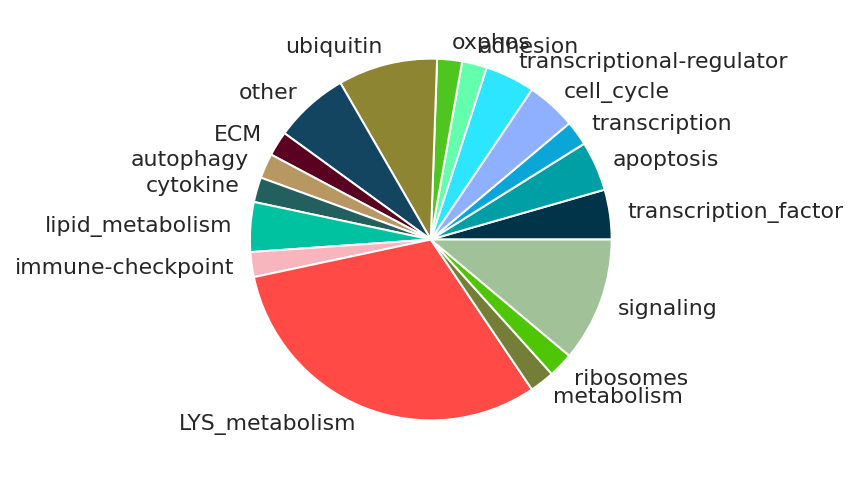

In [69]:
#plot
save_name = 'Expimap_LYS_pie_interpret.svg'
fig, ax = plt.subplots()
plt.pie(counts, labels = labels,colors=[color_dict[x] for x in labels])
plt.savefig(fig_save_path+save_name)

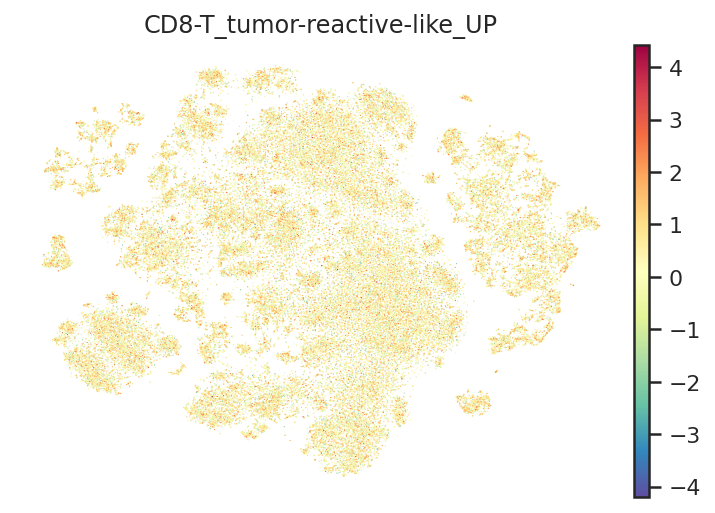

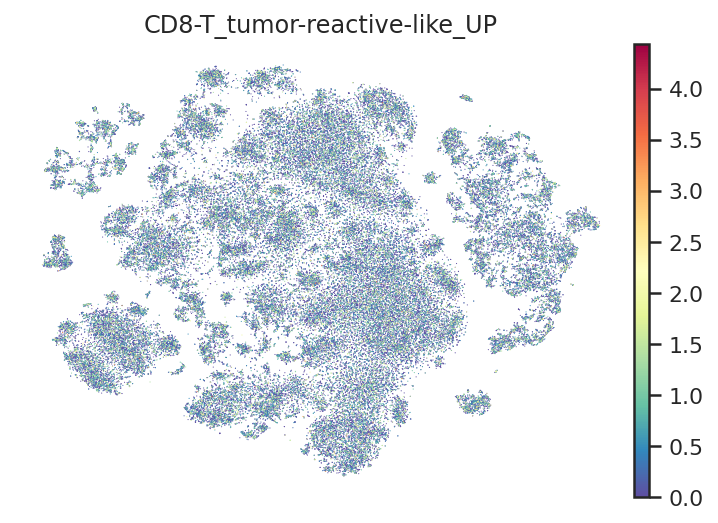

In [72]:
sc.pl.tsne(adata, color=[tumor_reac_factor], frameon=False,cmap='Spectral_r',save='Expimap_default_tumorreac_nothresh_alpha{}.svg'.format(ALPHA))
sc.pl.tsne(adata, color=[tumor_reac_factor], frameon=False,cmap='Spectral_r',vmin=0,save='Expimap_default_tumorreac_thresh_alpha{}.svg'.format(ALPHA))

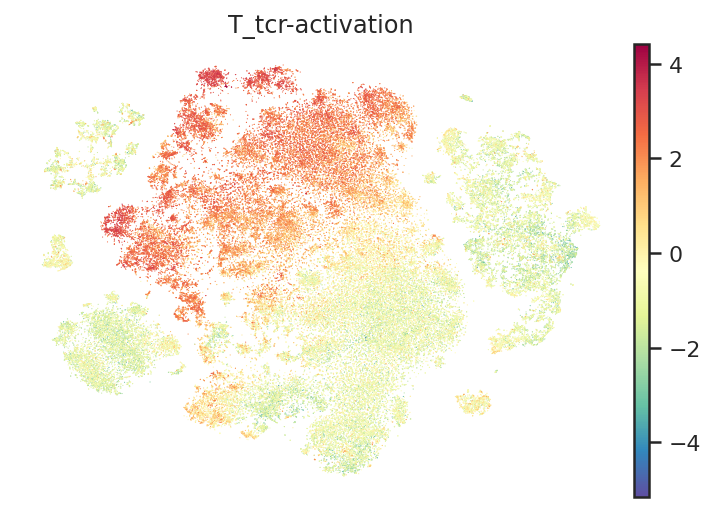

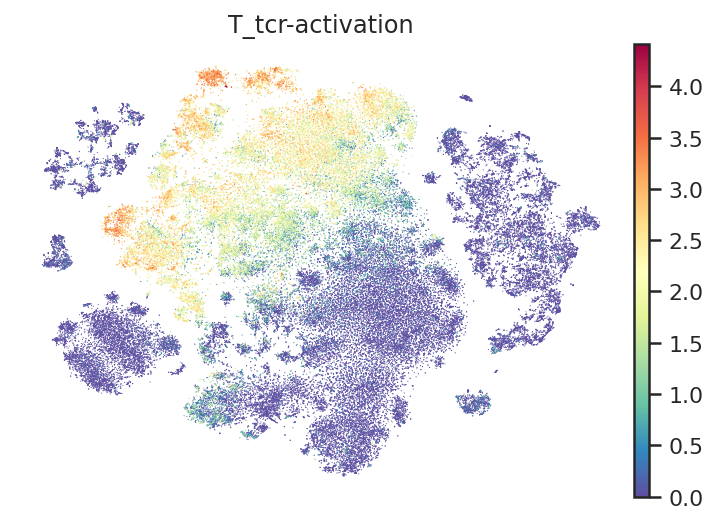

In [72]:
sc.pl.tsne(adata, color=['T_tcr-activation'], frameon=False,cmap='Spectral_r',save='Expimap_default_TCR_nothresh_alpha{}.svg'.format(ALPHA))
sc.pl.tsne(adata, color=['T_tcr-activation'], frameon=False,cmap='Spectral_r',vmin=0,save='Expimap_default_TCR_thresh_alpha{}.svg'.format(ALPHA))

In [73]:
#get the original adata which does not have its genes filtered out
adata_native = adata #sc.read(adata_path)

In [74]:
adata_native.obs['all_type-II-ifn-response'] = adata.obs['all_type-II-ifn-response']

In [75]:
adata_native.obs['is_Mac'] =  pd.Categorical((adata_native.obs['annotation_SPADE_1']=='MDC').astype(str))
set(adata_native.obs['is_Mac'])

{'False', 'True'}

saved Figure to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_IFNGR1_dot_imputed_expimap_alphaalphal0.8_4khv.svg
SignificanceResult(statistic=0.0068841304955131665, pvalue=0.031274312982085634)
Pearson: PearsonRResult(statistic=0.005102462656622722, pvalue=0.11044491016474915)


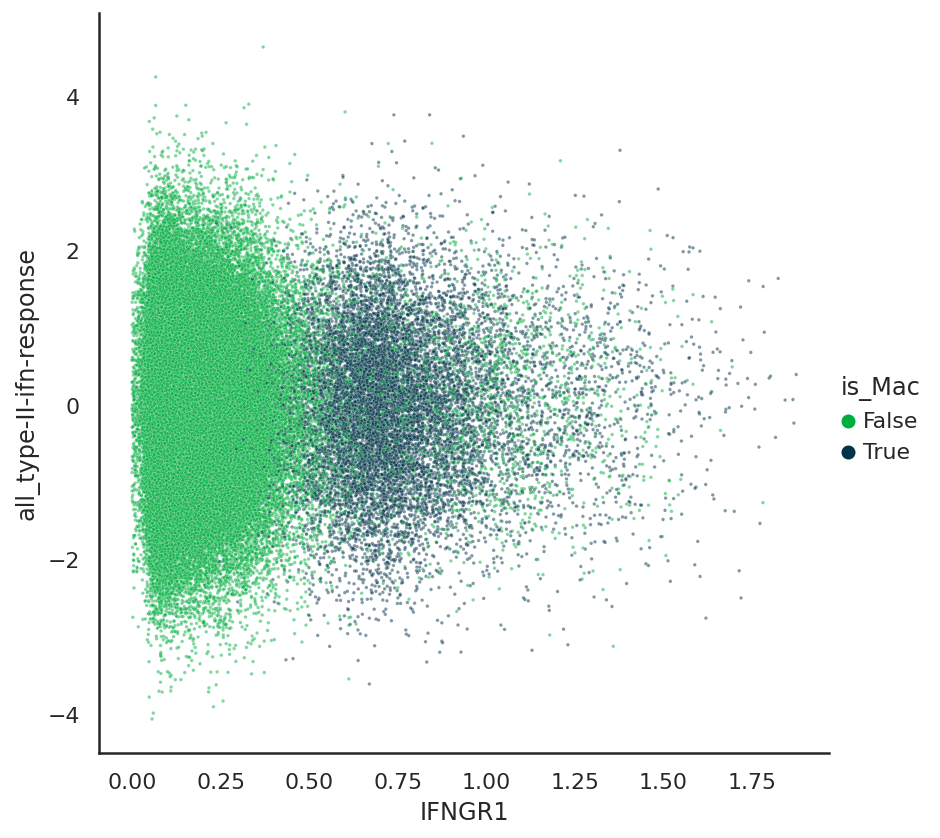

In [76]:
factor ='all_type-II-ifn-response'
celltype = 'is_Mac'
receptor ='IFNGR1'
use_imputed = True
adata_native  = randomize_cells(adata_native)
save_name = 'Bassez_IFNGR1_dot_imputed_expimap_alpha{}.svg'.format(ALPHA)

sns.set_theme(style="white")

if use_imputed:
    receptor_exp = np.array(adata_native[:,receptor].layers['imputed']).flatten()
else:
    receptor_exp = np.array(adata_native[:,receptor].X.todense()).flatten()
sns.relplot(x=receptor_exp, y=adata_native.obs[factor], hue=adata_native.obs[celltype],
            sizes=(40, 400), alpha=.5, palette={'True':'#013349','False':'#00AE3F'},
            height=6,s=3)

title_corr = scipy.stats.spearmanr(receptor_exp, np.array(adata_native.obs[factor]), axis=0, nan_policy='propagate')
plt.xlabel(receptor)
fig_save_path_complete = fig_save_path+save_name
plt.savefig(fig_save_path_complete,dpi=300)
print('saved Figure to:',fig_save_path_complete)
print(scipy.stats.spearmanr(receptor_exp, b=adata_native.obs[factor], axis=0, nan_policy='propagate', alternative='two-sided'))
print('Pearson:',scipy.stats.pearsonr(receptor_exp, adata_native.obs[factor]))

saved Figure to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Bassez_IFNGR1_dot_imputed_expimap_default_thresh0_alphaalphal0.8_4khv.svg
SignificanceResult(statistic=0.0068841304955131665, pvalue=0.031274312982085634)
Pearson: PearsonRResult(statistic=0.005102462656622718, pvalue=0.11044491016474915)


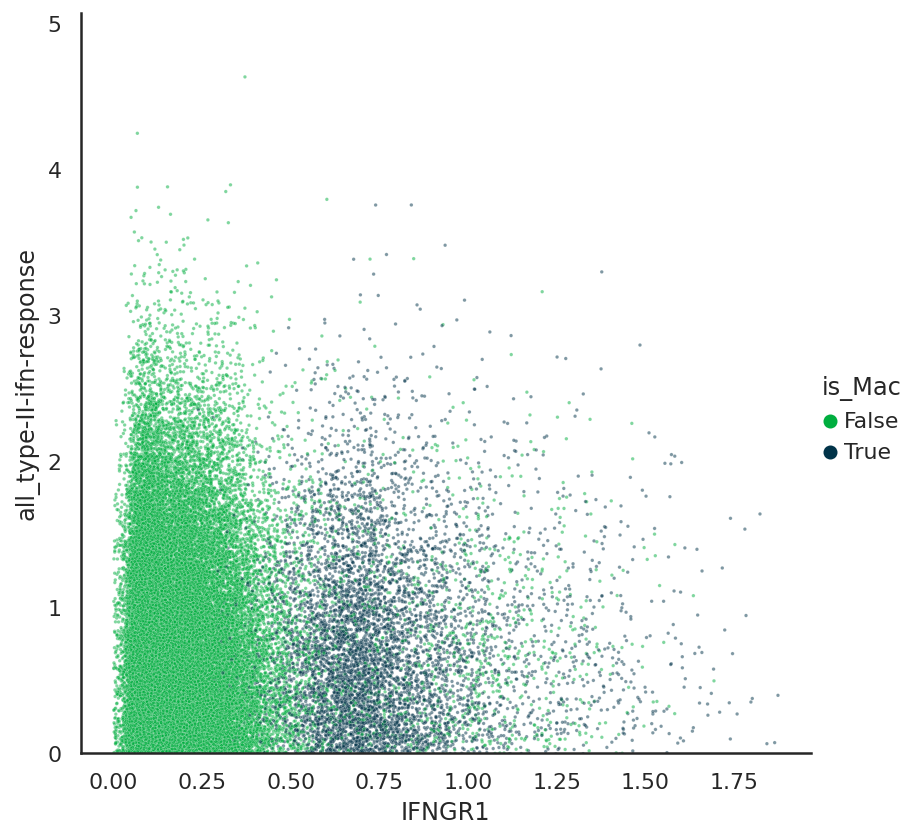

In [77]:
factor ='all_type-II-ifn-response'
celltype = 'is_Mac'
receptor ='IFNGR1'
use_imputed = True
adata_native  = randomize_cells(adata_native)
save_name = 'Bassez_IFNGR1_dot_imputed_expimap_default_thresh0_alpha{}.svg'.format(ALPHA)

sns.set_theme(style="white")

if use_imputed:
    receptor_exp = np.array(adata_native[:,receptor].layers['imputed']).flatten()
else:
    receptor_exp = np.array(adata_native[:,receptor].X.todense()).flatten()
sns.relplot(x=receptor_exp, y=adata_native.obs[factor], hue=adata_native.obs[celltype],
            sizes=(40, 400), alpha=.5, palette={'True':'#013349','False':'#00AE3F'},
            height=6,s=3)

title_corr = scipy.stats.spearmanr(receptor_exp, np.array(adata_native.obs[factor]), axis=0, nan_policy='propagate')
plt.xlabel(receptor)
plt.ylim(0,)
fig_save_path_complete = fig_save_path+save_name
plt.savefig(fig_save_path_complete,dpi=300)
print('saved Figure to:',fig_save_path_complete)
print(scipy.stats.spearmanr(receptor_exp, b=adata_native.obs[factor], axis=0, nan_policy='propagate', alternative='two-sided'))
print('Pearson:',scipy.stats.pearsonr(receptor_exp, adata_native.obs[factor]))

In [78]:
adata_celltype = adata[adata.obs['annotation_SPADE_1']=='CD8_T']

(28766, 3)
(28766, 3)
(28766, 3)
saved to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/Exhaustion_reactivity_expimap_default_density_alphaalphal0.8_4khv.svg
SignificanceResult(statistic=-0.005961677209534477, pvalue=0.3119696046135447)


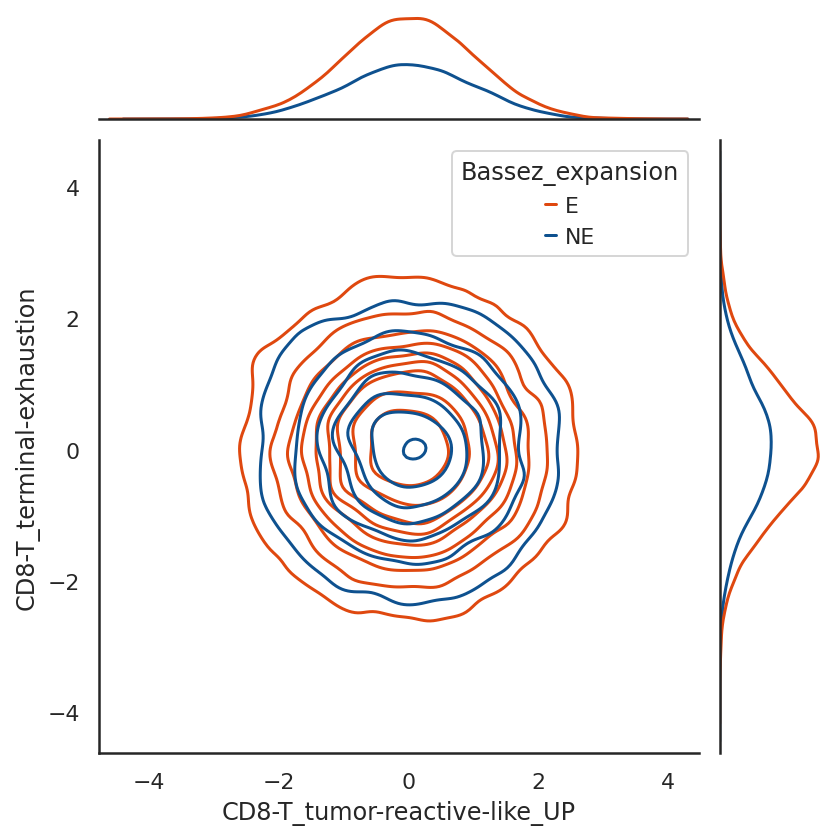

In [79]:
%matplotlib inline
exhaustion_factor = 'CD8-T_terminal-exhaustion'
tumor_reac_factor = 'CD8-T_tumor-reactive-like_UP'

#create df for scatter
save_name = 'Exhaustion_reactivity_expimap_default_density_alpha{}.svg'.format(ALPHA)
#create dict for batches to sample ids
clinical_var_key = 'Bassez_expansion'
use_gene_expression = True
hue_order = ['E','NE']
factor_list = [exhaustion_factor, tumor_reac_factor]

#zero_cutoff = 0

df = adata_celltype[adata_celltype.obs[clinical_var_key].isin(hue_order)].obs[[clinical_var_key]+factor_list]
print(df.shape)
#df = df[df[factor_list[0]]>zero_cutoff]
print(df.shape)
#df = df[df[factor_list[1]]>zero_cutoff]
print(df.shape)

#calculate correlation
title = scipy.stats.spearmanr(np.array(df[factor_list[0]]), np.array(df[factor_list[1]]), axis=0, nan_policy='propagate')

#plot
sns.set_theme(style="white")
#sns.relplot(x=factor_list[1], y=factor_list[0], hue=clinical_var_key,
  #          sizes=(40, 400), alpha=.5, palette=['#DF480F','#0E518F','#000000'],
 #           height=3, data=df,s=4)

g = sns.jointplot(
    data=df,
    x=df.columns[2], y=df.columns[1] ,hue=df.columns[0],hue_order = hue_order,palette=['#DF480F','#0E518F'],
    kind="kde",
)

#draw_square_gate(df, g, clinical_var_key, factor_list[1], factor_list[0], (0.7,1.5),(-0.002,0.015),
                # width=2, color='#000000',print_absolute=False)


#plt.title(title)
save_name_complete = fig_save_path + save_name
plt.savefig(save_name_complete)
print('saved to:',save_name_complete)
print(title)

### Aggregate per sample

In [76]:
adata_expimap_celltype = adata[adata.obs['annotation_SPADE_1']=='CD8_T']
adata_expimap_celltype

View of AnnData object with n_obs × n_vars = 31925 × 3946
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno

In [77]:
#calculate aggregate factor loadings per batch

#set parameters0
factor_name_list_corr = list(adata.uns['terms'])
clinical_var_obs = 'Bassez_timepoint' #obs for clinical variable to correlate with
clinical_var2_obs = 'Bassez_expansion'
patient_obs = 'Bassez_patient_id'
obs_columns = ['clinical_var','clinical_var2','patient'] #these will store the obs above and will be dropped for calculations
zero_cutoff = None


df_batches = aggregate_cell_scores(adata_expimap_celltype,clinical_var_obs,clinical_var2_obs,factor_name_list_corr,batch_key='batch',
                      patient_obs=patient_obs,
                            obs_columns=['clinical_var','clinical_var2','patient'],
                            zero_cutoff =zero_cutoff)



In [79]:
#wilcoxon matched pairs test

result= compare_factors(df_batches[df_batches['clinical_var']=='On'],tumor_reac_factor,'patient','clinical_var2',
                       ['E','NE'], test='mann-whitney')
result

MannwhitneyuResult(statistic=159.0, pvalue=0.8019149534876957)

In [85]:
df_sub = df_batches[df_batches['clinical_var']=='Pre']
df_sub_1 = df_sub[df_sub['clinical_var2']=='NE']
df_sub_2  = df_sub[df_sub['clinical_var2']=='E']
print('effect size',(np.mean(df_sub_1[tumor_reac_factor])-np.mean(df_sub_2[tumor_reac_factor]))/np.std(list(df_sub_1[tumor_reac_factor])+list(df_sub_2[tumor_reac_factor])))
print('fold change:',np.mean(df_sub_2[tumor_reac_factor]/np.mean(df_sub_1[tumor_reac_factor])))

effect size -0.19404650520477565
fold change: -1.5095913659643057


In [82]:
#wilcoxon matched pairs test

result= compare_factors(df_batches[df_batches['clinical_var']=='Pre'], tumor_reac_factor,'patient','clinical_var2',
                       ['E','NE'], test='mann-whitney')
result

MannwhitneyuResult(statistic=167.0, pvalue=0.9882260182231619)

In [84]:
df_sub = df_batches[df_batches['clinical_var']=='On']
df_sub_1 = df_sub[df_sub['clinical_var2']=='NE']
df_sub_2  = df_sub[df_sub['clinical_var2']=='E']
print('effect size',(np.mean(df_sub_1[tumor_reac_factor])-np.mean(df_sub_2[tumor_reac_factor]))/np.std(list(df_sub_1[tumor_reac_factor])+list(df_sub_2[tumor_reac_factor])))
print('fold change:',np.mean(df_sub_2[tumor_reac_factor]/np.mean(df_sub_1[tumor_reac_factor])))

effect size -0.15000833050861762
fold change: 0.3541318789318992


saved to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/CD8-T_tumor-reactive-like_UP_expimap_alphaalphal0.8_4khv.svg


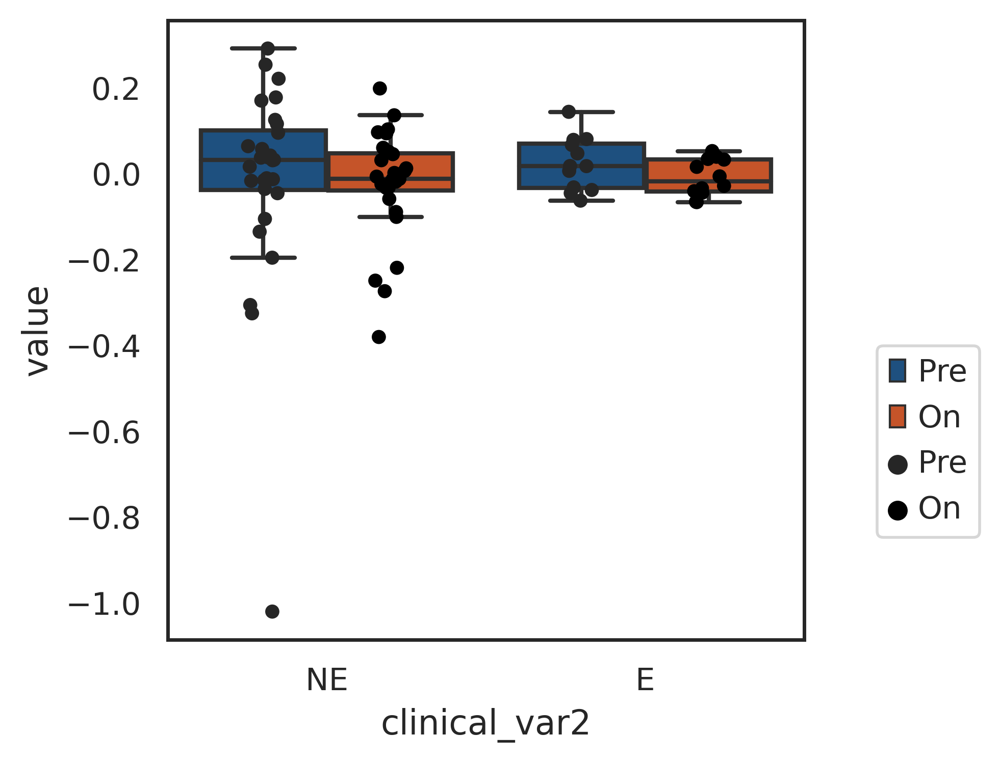

In [67]:
gene_set =  tumor_reac_factor
save_name = gene_set + '_expimap_alpha{}'.format(ALPHA) + '.svg'

clinical_var_to_include = ['Pre','On']
clinical_var_to_include2 = ['NE','E',]
sns.set_style('white')
df_plot = df_batches.copy()   
df_plot = df_plot.melt(id_vars=['clinical_var','clinical_var2'])
df_plot = df_plot[df_plot['variable']==gene_set]
df_plot = df_plot[df_plot['clinical_var'].isin(clinical_var_to_include)]
df_plot = df_plot[df_plot['clinical_var2'].isin(clinical_var_to_include2)]

ax = sns.boxplot(x='clinical_var2',y='value',hue='clinical_var',data=df_plot, showfliers = False,
                hue_order=clinical_var_to_include,order=clinical_var_to_include2,palette=timepoint_dict)
sns.stripplot(x='clinical_var2',y='value',hue='clinical_var',data=df_plot, color='#000000',dodge=True,
             hue_order=clinical_var_to_include,order=clinical_var_to_include2)
#ax.set_ylim(0,)
plt.legend(bbox_to_anchor=(0.8, 0., 0.5, 0.5))
save_name_complete = fig_save_path + save_name
plt.savefig(save_name_complete)
print('saved to:',save_name_complete)

In [69]:
#wilcoxon matched pairs test

result= compare_factors(df_batches[df_batches['clinical_var']=='On'].fillna(0),exhaustion_factor,'patient','clinical_var2',
                       ['E','NE'], test='mann-whitney')
result

MannwhitneyuResult(statistic=175.0, pvalue=0.8478664138880776)

In [70]:
df_sub = df_batches[df_batches['clinical_var']=='Pre']
df_sub_1 = df_sub[df_sub['clinical_var2']=='NE']
df_sub_2  = df_sub[df_sub['clinical_var2']=='E']
print('effect size',(np.mean(df_sub_1[tumor_reac_factor])-np.mean(df_sub_2[tumor_reac_factor]))/np.std(list(df_sub_1[tumor_reac_factor])+list(df_sub_2[tumor_reac_factor])))
print('fold change:',np.mean(df_sub_1[tumor_reac_factor])/np.mean(df_sub_2[tumor_reac_factor]))

effect size -0.19404650520477565
fold change: -0.662430921735707


In [71]:
#wilcoxon matched pairs test

result= compare_factors(df_batches[df_batches['clinical_var']=='Pre'], exhaustion_factor,'patient','clinical_var2',
                       ['E','NE'], test='mann-whitney')
result

MannwhitneyuResult(statistic=156.0, pvalue=0.7342995544245301)

In [72]:
df_sub = df_batches[df_batches['clinical_var']=='On']
df_sub_1 = df_sub[df_sub['clinical_var2']=='NE']
df_sub_2  = df_sub[df_sub['clinical_var2']=='E']
print('effect size',(np.mean(df_sub_1[tumor_reac_factor])-np.mean(df_sub_2[tumor_reac_factor]))/np.std(list(df_sub_1[tumor_reac_factor])+list(df_sub_2[tumor_reac_factor])))
print('fold change:',np.mean(df_sub_1[tumor_reac_factor])/np.mean(df_sub_2[tumor_reac_factor]))

effect size -0.15000833050861762
fold change: 2.8238067779046334


saved to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/CD8-T_terminal-exhaustion_expimap_alphaalphal0.8_4khv.svg


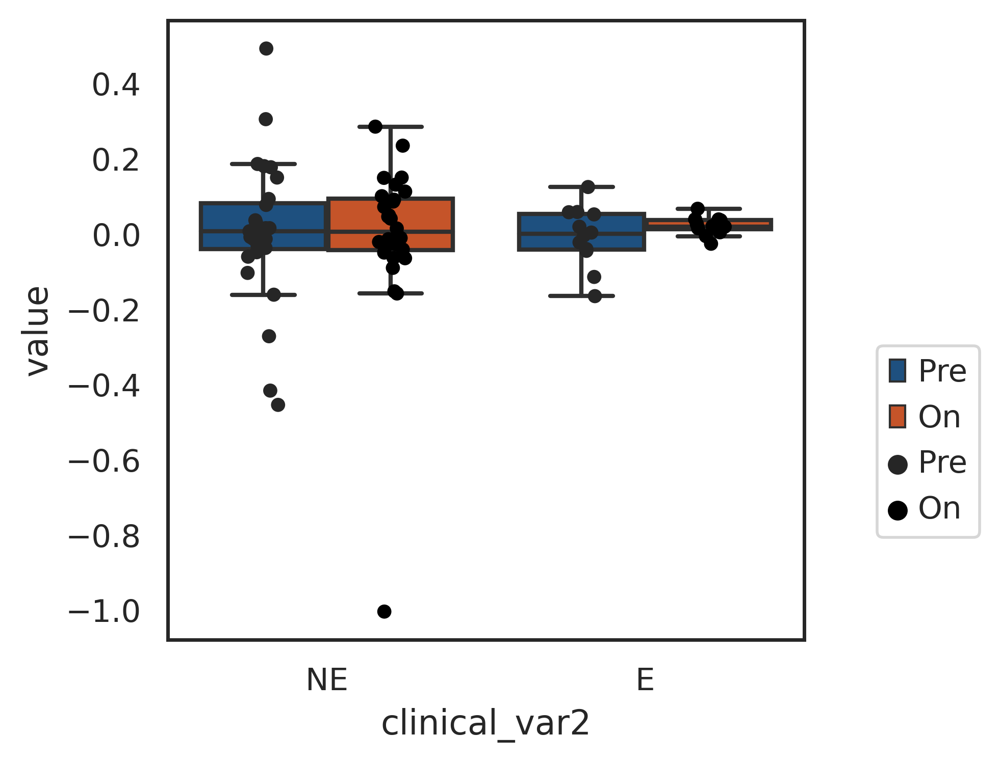

In [74]:
gene_set =  exhaustion_factor
save_name = gene_set + '_expimap_alpha{}'.format(ALPHA) + '.svg'

clinical_var_to_include = ['Pre','On']
clinical_var_to_include2 = ['NE','E',]
sns.set_style('white')
df_plot = df_batches.copy()   
df_plot = df_plot.melt(id_vars=['clinical_var','clinical_var2'])
df_plot = df_plot[df_plot['variable']==gene_set]
df_plot = df_plot[df_plot['clinical_var'].isin(clinical_var_to_include)]
df_plot = df_plot[df_plot['clinical_var2'].isin(clinical_var_to_include2)]

ax = sns.boxplot(x='clinical_var2',y='value',hue='clinical_var',data=df_plot, showfliers = False,
                hue_order=clinical_var_to_include,order=clinical_var_to_include2,palette=timepoint_dict)
sns.stripplot(x='clinical_var2',y='value',hue='clinical_var',data=df_plot, color='#000000',dodge=True,
             hue_order=clinical_var_to_include,order=clinical_var_to_include2)
#ax.set_ylim(0,)
plt.legend(bbox_to_anchor=(0.8, 0., 0.5, 0.5))
save_name_complete = fig_save_path + save_name
plt.savefig(save_name_complete)
print('saved to:',save_name_complete)